<img src="header.png"/>

# Execution du notebook

Le présent notebook suppose l'arborescence suivante, pour le chargement des données et l'écriture des résultats : 

```bash
├───data
│   ├───processed
│   │   └───df_fix.pkl
│   │   └───df_imp.pkl
│   └───raw
│       └───fr.openfoodfacts.org.products.csv
├───notebooks
│   ├───1_Exploration.ipynb
│   ├───2_Analysis.ipynb
│   └───header.png
└───src
    ├───functions.py
    └───__init__.py
```

Les fichiers `df_fix.pkl` et `df_imp.pkl` sont issus de l'exécution du notebook `1_Exploration.ipynb`.

# Initialisation du projet

In [1]:
# General
import os
import pickle

# Math & data
import numpy as np
import pandas as pd
from datetime import date
import math

# Graphics
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# ML
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.pipeline import Pipeline

from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error

from sklearn.base import BaseEstimator, TransformerMixin

In [19]:
%load_ext autoreload
# %reload_ext autoreload
%autoreload 2

In [3]:
import DisplotData, DisplotML, PwePwocess, Funktiuns
from DisplotData import bcolors
import MLstuff

In [4]:
# Constants
EPSILON = 1.e-12
TOL = 1.05 # 5% of tolerance for comparisons 
CAL_TO_J = 4.1868

Pour sauvegarder les figures :

In [5]:
SAVE_FIGS = False

# Chargement des données

In [6]:
data_raw_dir = '../data/raw/'
data_processed_dir = '../data/processed/'

Le dataset nettoyé et imputé est issu du notebook d'exploration et nettoyage :

In [7]:
file = open(data_processed_dir+'df_imp.pkl', 'rb')
df_imp = pickle.load(file)
file.close()

On charge également le dataset initial et le dataset nettoyé mais _pas imputé_, pour des comparaisons :

In [8]:
df_init = pd.read_csv(data_raw_dir+'fr.openfoodfacts.org.products.csv', delimiter='\t')

C:\Users\a072108\AppData\Local\Temp\ipykernel_22248\3817663454.py:1: DtypeWarning: Columns (0,3,5,19,20,24,25,26,27,28,35,36,37,38,39,48) have mixed types. Specify dtype option on import or set low_memory=False.
  df_init = pd.read_csv(data_raw_dir+'fr.openfoodfacts.org.products.csv', delimiter='\t')


In [9]:
file = open(data_processed_dir+'df_fix.pkl','rb')
df_fix = pickle.load(file)
file.close()

# Analyses statistiques des données

In [10]:
df_imp.describe()

,energy_100g,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fiber_100g,nutrition-score-fr_100g,additives_n,ingredients_from_palm_oil_n,labels_n
count,69717.000000,69717.000000,69717.000000,69717.000000,69717.000000,69717.000000,69717.000000,69717.000000,69717.000000,69717.000000,69717.000000,69717.000000
mean,998.469382,7.451895,24.993014,12.411939,12.179453,4.819477,0.328060,1.842063,7.055883,1.463804,0.047306,1.595292
std,805.704160,8.164155,26.991048,18.688673,17.232264,8.170681,0.740543,3.374185,9.040809,2.370781,0.215645,2.131507
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-15.000000,0.000000,0.000000,0.000000
25%,278.000000,1.000000,2.900000,0.600000,0.400000,0.020000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,845.000000,5.000000,12.100000,3.330000,4.500000,1.300000,0.138000,0.700000,5.000000,0.000000,0.000000,1.000000
75%,1553.000000,10.000000,50.700000,15.000000,19.000000,6.100000,0.440945,2.200000,14.000000,2.000000,0.000000,3.000000
max,3925.000000,86.000000,105.000000,105.000000,101.000000,100.000000,83.000000,94.800000,40.000000,31.000000,2.000000,22.000000


Cette table nous apprend peu de choses, les différentes catégories de produits étant mélangées.  

## Analyses univariées

### Distributions des variables catégorielles

In [11]:
df_imp.columns

Index(['product_name', 'brands', 'pnns_groups_1', 'pnns_groups_2',
       'energy_100g', 'proteins_100g', 'carbohydrates_100g', 'sugars_100g',
       'fat_100g', 'saturated-fat_100g', 'sodium_100g', 'fiber_100g',
       'nutrition-score-fr_100g', 'additives_n', 'ingredients_from_palm_oil_n',
       'labels_n', 'nutrition_grade_fr'],
      dtype='object')

In [12]:
categ_cols = ['pnns_groups_1', 'pnns_groups_2', 'nutrition_grade_fr']
num_cols = [
    'energy_100g', 'proteins_100g', 'carbohydrates_100g', 'sugars_100g',
    'fat_100g', 'saturated-fat_100g', 'sodium_100g', 'fiber_100g',
    'nutrition-score-fr_100g', 'additives_n', 'ingredients_from_palm_oil_n'
]
all_cols = []
if categ_cols:
    all_cols.extend(categ_cols)
if num_cols:
    all_cols.extend(num_cols)

On peut relancer les tracés de distribution de l'exploration, sur le dataset imputé :

In [13]:
plt.rcParams['figure.figsize'] = [6, 4]
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

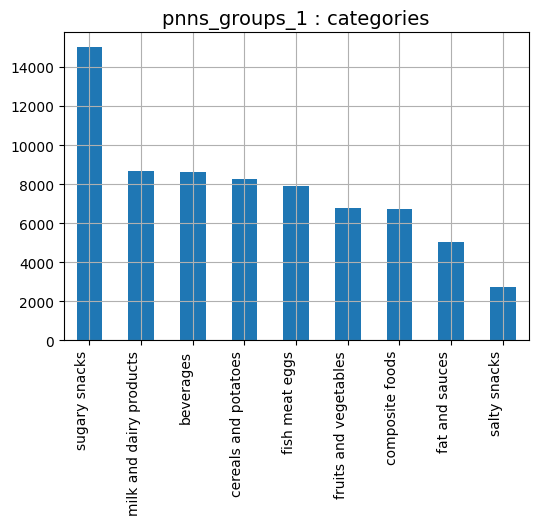

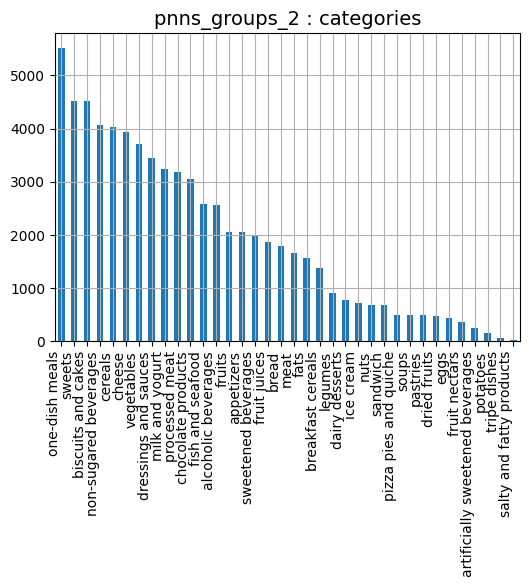

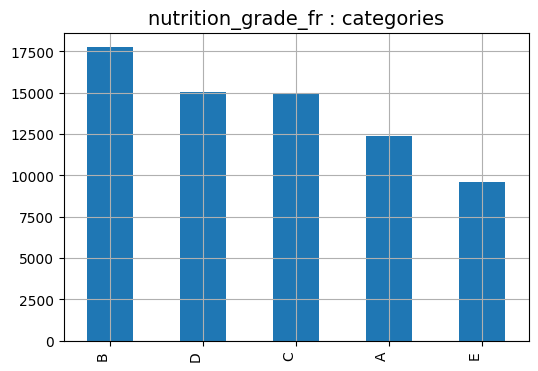

In [22]:
n = len(all_cols)
ind = 0
for colonne in categ_cols:
    ind += 1
    df2 = DisplotData.plot_categ_bars(df_imp, colonne, seuil=1., max_bar=50, kind='bar', rot=90, show_nan=False)

Mais on va opter pour des diagrammes en secteurs :

In [23]:
plt.rcParams['figure.figsize'] = [6, 6]
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

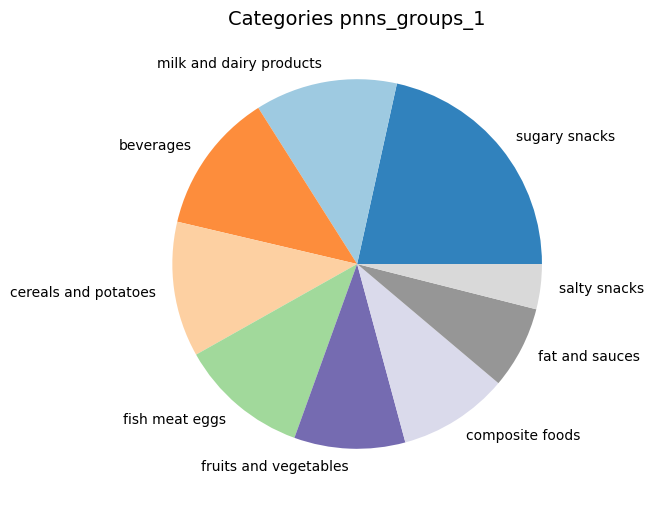

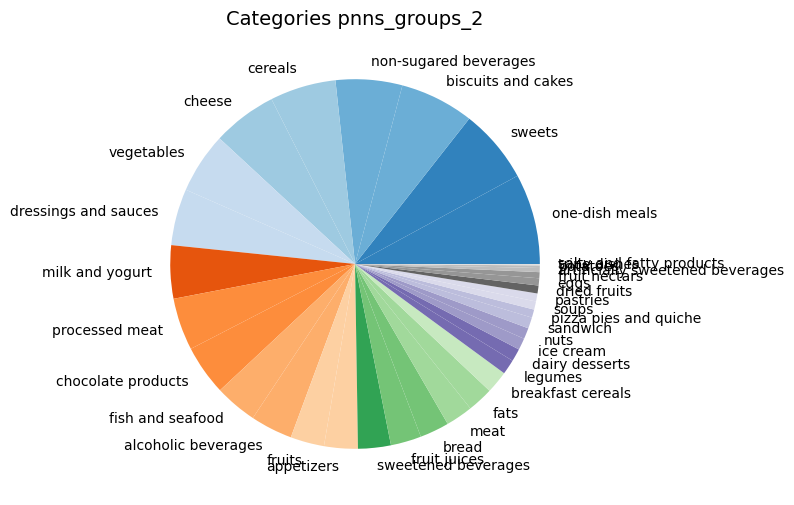

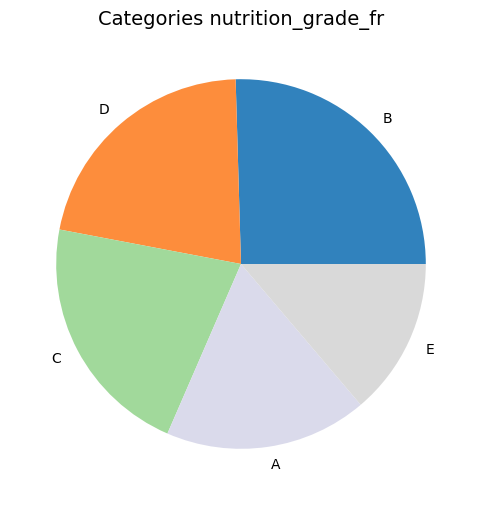

In [24]:
for colonne in categ_cols:
    plt.figure()
    df_imp[colonne].value_counts(normalize=True).plot(kind='pie', colormap='tab20c')
    plt.title('Categories '+colonne)
    plt.ylabel('')
    plt.show()

Concernant `pnns_groups_2`, le mieux serait de créer une catégorie `'Others'` pour les 5 dernières catégories.

### Distributions des variables numériques

In [25]:
num_cols

['energy_100g',
 'proteins_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fat_100g',
 'saturated-fat_100g',
 'sodium_100g',
 'fiber_100g',
 'nutrition-score-fr_100g',
 'additives_n',
 'ingredients_from_palm_oil_n']

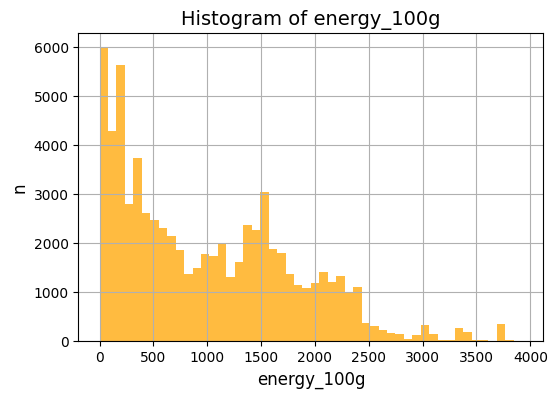

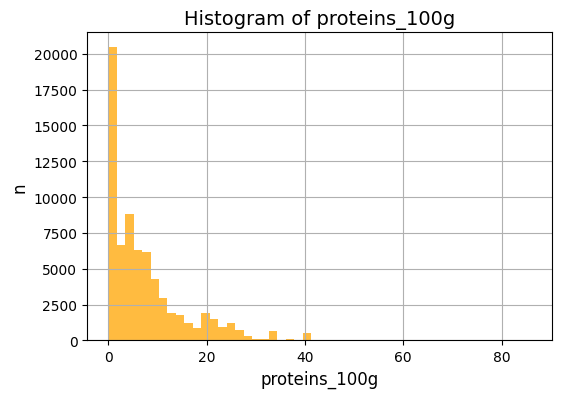

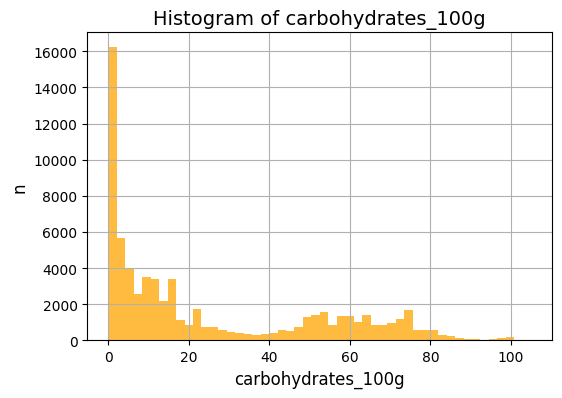

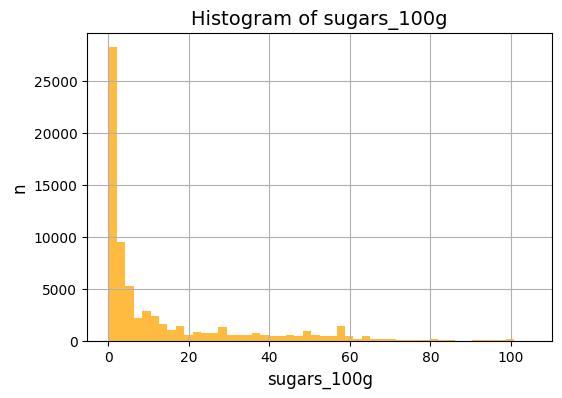

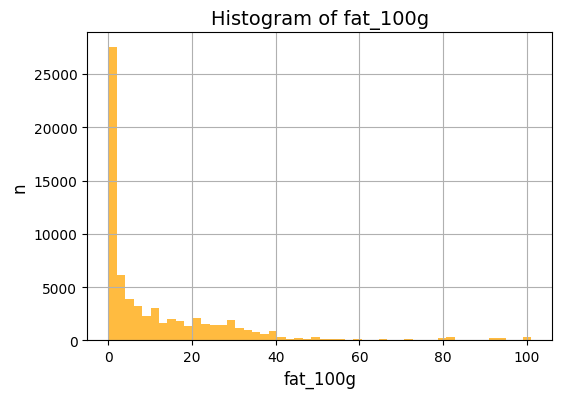

...

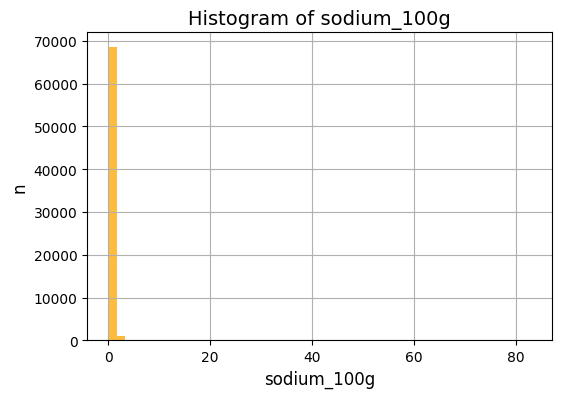

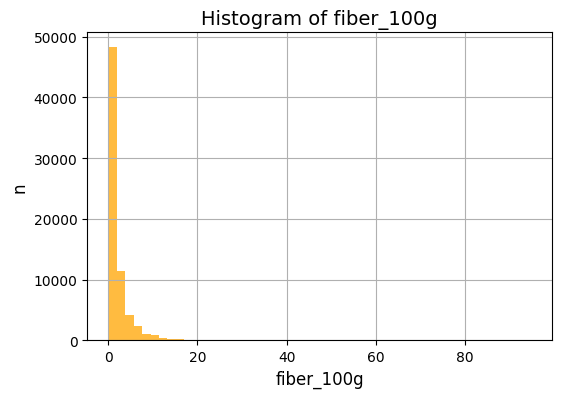

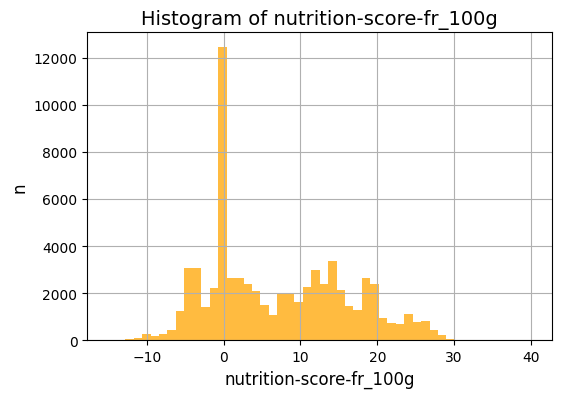

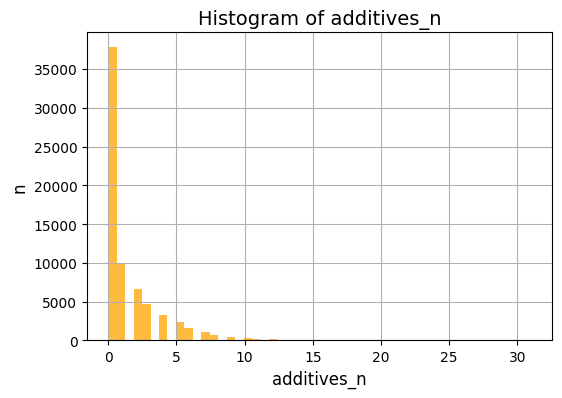

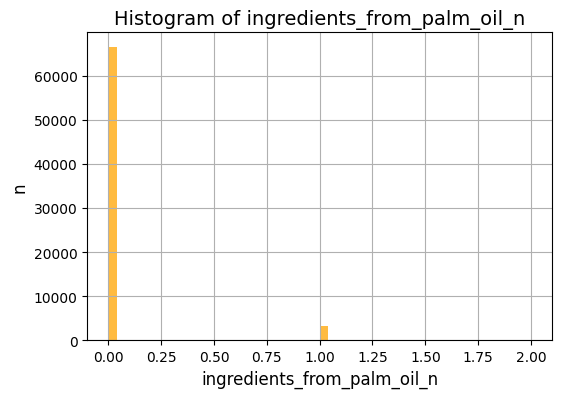

In [26]:
plt.rcParams['figure.figsize'] = [6, 4]
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
for var in num_cols:
    vals = df_imp[var].values
    n, bins, patches = plt.hist(vals, 50, density=False, facecolor='orange', alpha=0.75)  # 'c'
    plt.xlabel(f'{var}')
    plt.ylabel('n')
    plt.title(f'Histogram of {var}')
    plt.grid(True)
    plt.show()

Focus sur les additifs, qui peuvent être vus comme une variable ordinale :

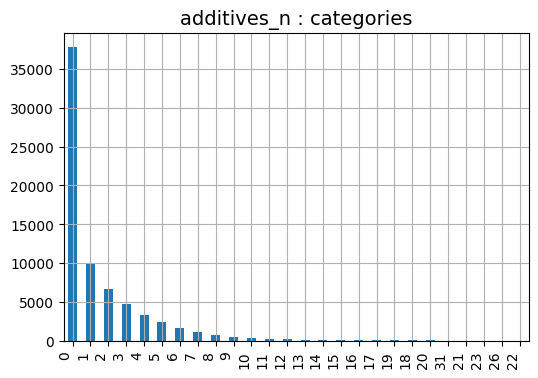

In [27]:
plt.rcParams['figure.figsize'] = [6, 4]
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 11
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
df2 = DisplotData.plot_categ_bars(df_imp, 'additives_n', seuil=1., max_bar=50, kind='bar', rot=90, show_nan=False)

In [28]:
df_imp['additives_n_synth'] = df_imp['additives_n']
df_imp.loc[df_imp['additives_n_synth']>=10, 'additives_n_synth'] = '10+'
df_imp['additives_n_synth'] = df_imp['additives_n_synth'].astype('str')

In [29]:
vals = pd.DataFrame(df_imp['additives_n_synth'].value_counts())
vals = vals.reset_index()
line = vals.loc[vals['index']=='10+']
lines = vals.loc[vals['index']!='10+']
vals = pd.concat([lines,line], axis=0, ignore_index=True)

In [30]:
plt.rcParams['figure.figsize'] = [6, 6]
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

In [31]:
explode = [0.02]
explode.extend([0]*(vals['additives_n_synth'].shape[0]-1))
explode

[0.02, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

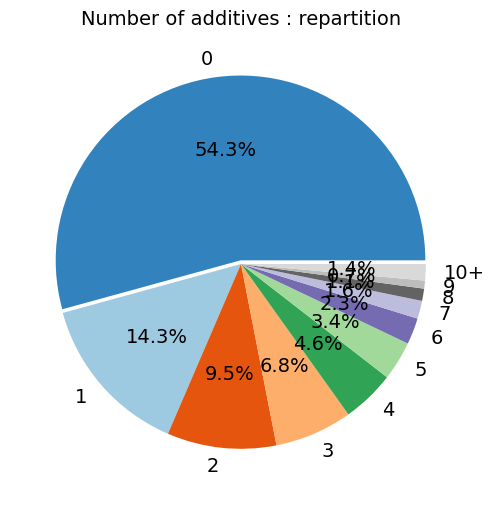

In [32]:
plt.figure()
vals['additives_n_synth'].plot(kind='pie',explode=explode,labels=vals['index'],
                               autopct='%1.1f%%',colormap='tab20c',textprops={'fontsize': 14}) # ,colormap='tab20c'
plt.title("Number of additives : repartition")
plt.ylabel('')
plt.show()

La répartition est intéressante pour l'application : les produits avec et sans additifs se partagent le marché ! Donc un a **une chance sur deux** d'avoir un produit **avec**, et tout autant de produits de substition **sans**, a priori. 

### Boxplots univariées

In [33]:
num_cols

['energy_100g',
 'proteins_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fat_100g',
 'saturated-fat_100g',
 'sodium_100g',
 'fiber_100g',
 'nutrition-score-fr_100g',
 'additives_n',
 'ingredients_from_palm_oil_n']

In [34]:
nutr_cols = [
    'proteins_100g', 'carbohydrates_100g', 'sugars_100g',
    'fat_100g', 'saturated-fat_100g',
    'sodium_100g', 'fiber_100g'
]

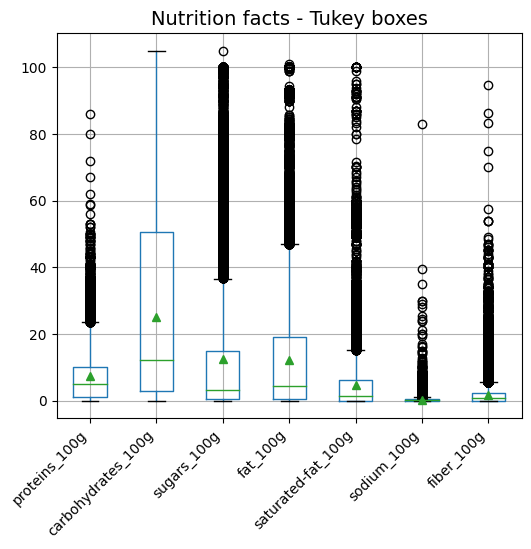

In [35]:
plt.rcParams['figure.figsize'] = [6, 5]
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

plt.figure()
df_imp[nutr_cols].boxplot(showmeans=True)
plt.title(f'Nutrition facts - Tukey boxes')
plt.xticks(rotation=45, ha='right')
plt.grid('on')

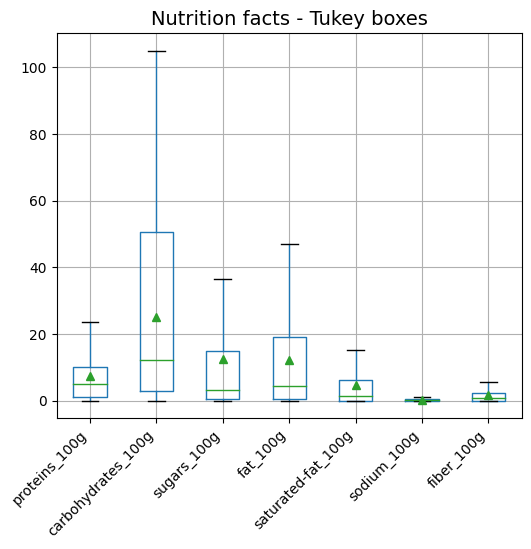

In [36]:
plt.rcParams['figure.figsize'] = [6, 5]
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

plt.figure()
df_imp[nutr_cols].boxplot(showmeans=True, showfliers=False)
plt.title(f'Nutrition facts - Tukey boxes')
plt.xticks(rotation=45, ha='right')
plt.grid('on')

Additifs :

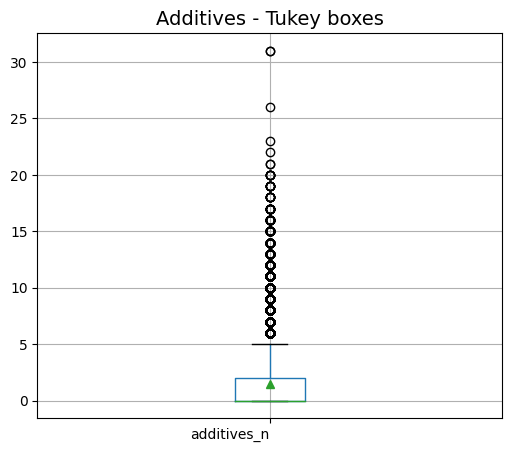

In [37]:
plt.rcParams['figure.figsize'] = [6, 5]
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

plt.figure()
df_imp[['additives_n']].boxplot(showmeans=True,showfliers=True)
plt.title(f'Additives - Tukey boxes')
plt.xticks(rotation=0, ha='right')
plt.grid('on')

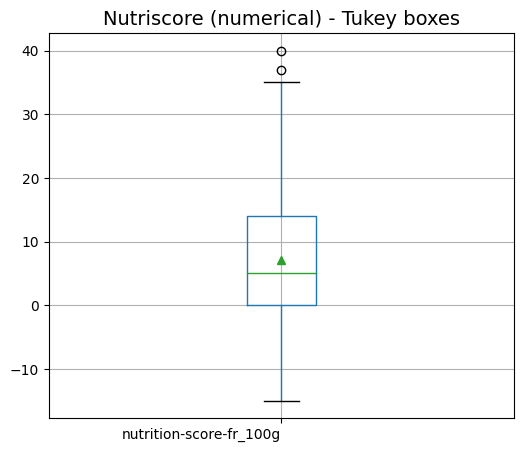

In [38]:
plt.rcParams['figure.figsize'] = [6, 5]
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

plt.figure()
df_imp[['nutrition-score-fr_100g']].boxplot(showmeans=True, showfliers=True)
plt.title(f'Nutriscore (numerical) - Tukey boxes')
plt.xticks(rotation=0, ha='right')
plt.grid('on')

## Analyses bivariées

### Nombre d'additifs en fonction du Nutri-Score (numérique)

In [39]:
additives_ns = {}
for ng in df_imp['nutrition_grade_fr'].unique():
    if ng:
        a = df_imp.loc[(df_imp['nutrition_grade_fr']==ng) & (df_imp['additives_n']>0)]['nutrition_grade_fr'].shape[0]
        b = df_imp.loc[df_imp['nutrition_grade_fr']==ng].shape[0]
        additives_ns[ng] = a / b * 100.

In [40]:
additives_ns = dict(sorted(additives_ns.items()))

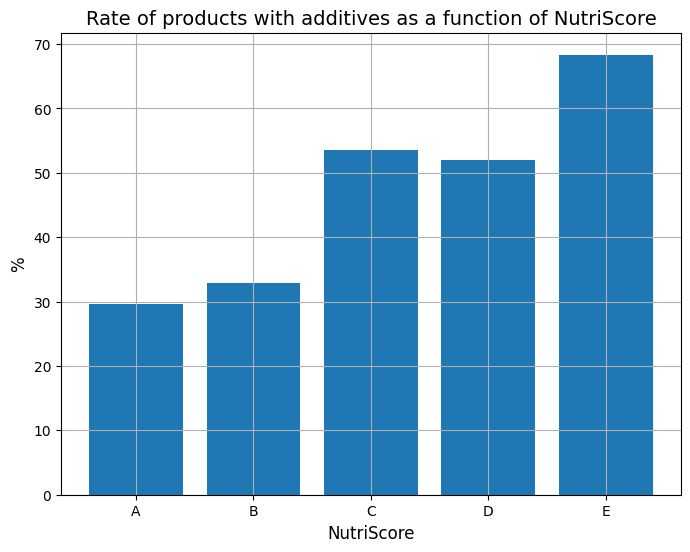

In [41]:
plt.rcParams['figure.figsize'] = [8, 6]
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

fig = plt.figure()
n = len(additives_ns.keys())
x = additives_ns.keys()
y = list(additives_ns.values())
plt.bar(x,y)
plt.title('Rate of products with additives as a function of NutriScore');
plt.xlabel('NutriScore')
plt.ylabel('%')
plt.grid('on')

Les nutri-scores reflètent quasiment la présence d'additifs !

### Taux d'ingr. issus d'huile de palme en fonction du nutriscore

In [42]:
palmoil_ns = {}
for ng in df_imp['nutrition_grade_fr'].unique():
    if ng:
        a = df_imp.loc[(df_imp['nutrition_grade_fr']==ng) & (df_imp['ingredients_from_palm_oil_n']>0)]['nutrition_grade_fr'].shape[0]
        b = df_imp.loc[df_imp['nutrition_grade_fr']==ng].shape[0]
        palmoil_ns[ng] = a / b * 100.

In [43]:
palmoil_ns = dict(sorted(palmoil_ns.items()))

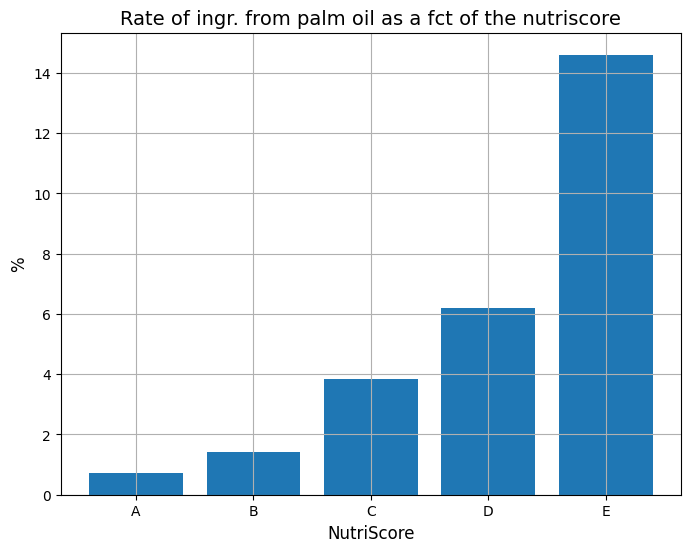

In [44]:
plt.rcParams['figure.figsize'] = [8, 6]
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
fig = plt.figure()
n = len(palmoil_ns.keys())

x = palmoil_ns.keys()
y = list(palmoil_ns.values())
plt.bar(x,y)
plt.title('Rate of ingr. from palm oil as a fct of the nutriscore');
plt.xlabel('NutriScore');
plt.ylabel('%');
plt.grid('on')

### Taux de produit "avec label" en fonction du Nutri-Score

In [45]:
label_ns = {}
for ng in df_imp['nutrition_grade_fr'].unique():
    if ng:
        a = df_imp.loc[(df_imp['nutrition_grade_fr']==ng) & (df_imp['labels_n']>0)]['nutrition_grade_fr'].shape[0]
        b = df_imp.loc[df_imp['nutrition_grade_fr']==ng].shape[0]
        label_ns[ng] = a / b

In [46]:
label_ns = dict(sorted(label_ns.items()))

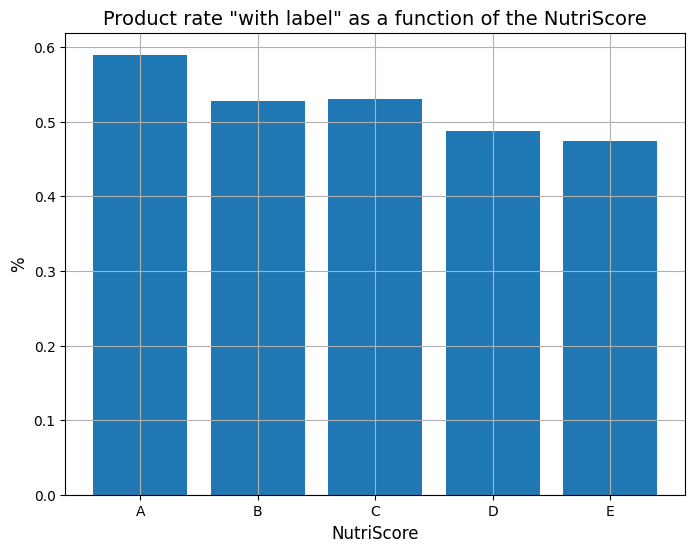

In [47]:
fig = plt.figure()
n = len(label_ns.keys())
x = list(label_ns.keys())
y = list(label_ns.values())
plt.bar(x,y)
plt.title('Product rate "with label" as a function of the NutriScore');
plt.xlabel('NutriScore');
plt.ylabel('%');
plt.grid('on')

De même, la présence de label suit légèrement le Nutri-Score !

### Nombre d'additifs en fonction du score nutritionnel (après choix du Use Case)

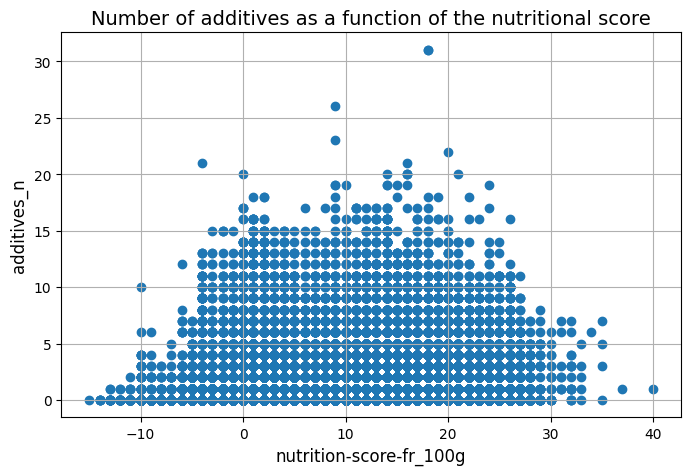

In [49]:
plt.rcParams['figure.figsize'] = [8, 5]
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.scatter(df_imp['nutrition-score-fr_100g'], df_imp['additives_n'])
plt.xlabel('nutrition-score-fr_100g')
plt.ylabel('additives_n')
plt.title("Number of additives as a function of the nutritional score")
plt.grid('on')
plt.show()

Sur cette représentation, on ne relève pas de dépendance entre le nombre d'additifs et le score nutritionnel. Les points sont peut-être surchargés.

In [50]:
add_moy = {}
for ns in df_imp['nutrition_grade_fr'].unique():
    add_moy[ns] = df_imp.loc[df_imp['nutrition_grade_fr']==ns,'additives_n'].mean()

In [51]:
add_moy = dict(sorted(add_moy.items()))

In [52]:
plt.rcParams['figure.figsize'] = [8, 6]
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

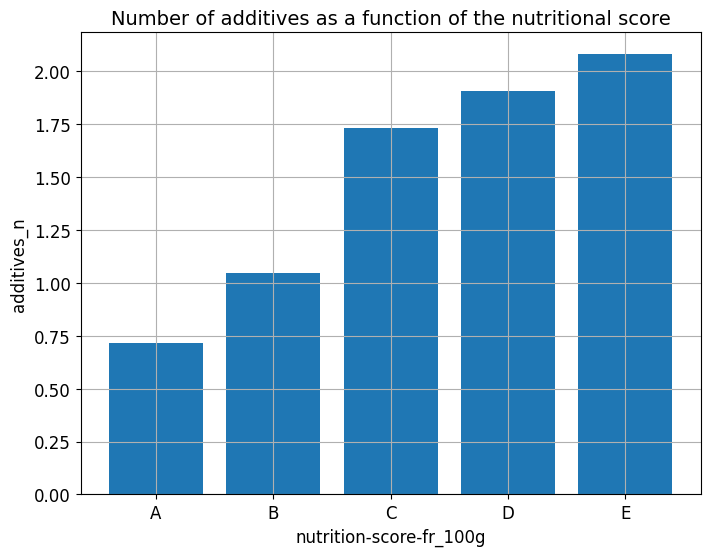

In [53]:
fig = plt.figure()
n = len(add_moy.keys())
x = additives_ns.keys()
y = list(add_moy.values())
plt.bar(x,y)
plt.xlabel('nutrition-score-fr_100g')
plt.ylabel('additives_n')
plt.title("Number of additives as a function of the nutritional score")
plt.grid('on')
plt.show()

### Variable numérique Vs variable catégorielle

#### Par groupe `pnns_groups_1` :

Boxplots des informations nutritionnelles et additifs :

In [54]:
df_imp.columns

Index(['product_name', 'brands', 'pnns_groups_1', 'pnns_groups_2',
       'energy_100g', 'proteins_100g', 'carbohydrates_100g', 'sugars_100g',
       'fat_100g', 'saturated-fat_100g', 'sodium_100g', 'fiber_100g',
       'nutrition-score-fr_100g', 'additives_n', 'ingredients_from_palm_oil_n',
       'labels_n', 'nutrition_grade_fr', 'additives_n_synth'],
      dtype='object')

In [55]:
categ_cols = ['pnns_groups_1', 'pnns_groups_2', 'nutrition_grade_fr']
num_cols = [
    'energy_100g', 'proteins_100g', 'carbohydrates_100g', 'sugars_100g',
    'fat_100g', 'saturated-fat_100g', 'sodium_100g', 'fiber_100g',
    'nutrition-score-fr_100g', 'additives_n'
]
col_compos = num_cols.copy()

In [56]:
all_cols = []
if categ_cols:
    all_cols.extend(categ_cols)
if num_cols:
    all_cols.extend(num_cols)

In [57]:
col_categ = 'pnns_groups_1'

In [58]:
def compute_stats(df, col_categ, col_compos):
    categs = df.loc[df[col_categ].notna()][col_categ].unique()
    groupes = {}
    stats = {}
    for nutr in col_compos:
        groupes[nutr] = []
        stats[nutr] = {}
        for cat in categs:
            ptit_df = df.loc[df[col_categ]==cat][nutr].copy()
            ptit_df = ptit_df.loc[ptit_df.notna()]
            groupes[nutr].append(ptit_df)
    
            stats[nutr][cat] = {}
            stats[nutr][cat]['mean'] = ptit_df.mean()
            stats[nutr][cat]['std'] = ptit_df.std()
    return(categs, groupes, stats)

In [59]:
def boxplots_per_categ(categs, groupes):
    medianprops = {'color': "black"}
    meanprops = {'marker': 'o', 'markeredgecolor': 'black',
                 'markerfacecolor': 'firebrick'}
    for nutr in groupes:
        plt.boxplot(groupes[nutr], groupes[nutr], labels=categs, 
                    showfliers=True, medianprops=medianprops,
                    showmeans=True, meanprops=meanprops,
                    vert=False, patch_artist=True)
        plt.title(nutr)
        plt.grid('on')
        plt.show()

Avant l'imputation :

In [60]:
plt.rcParams['figure.figsize'] = [8, 5]
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

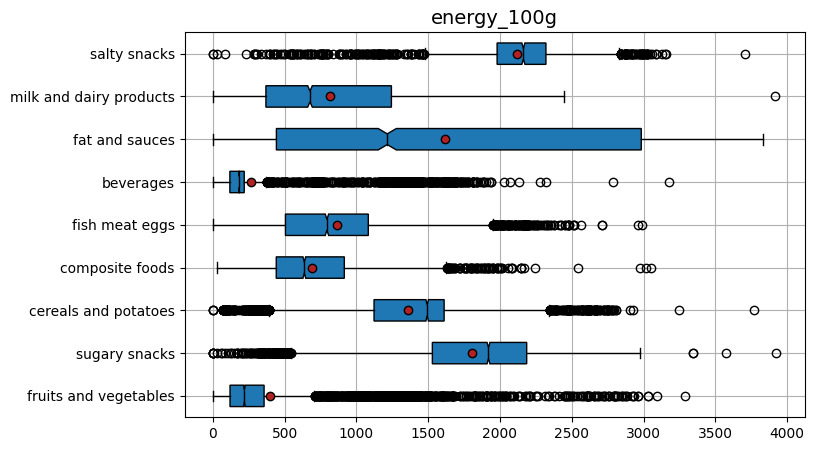

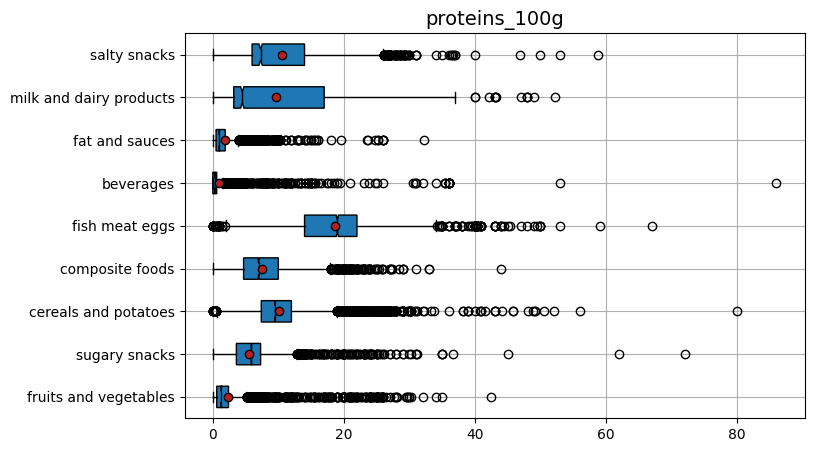

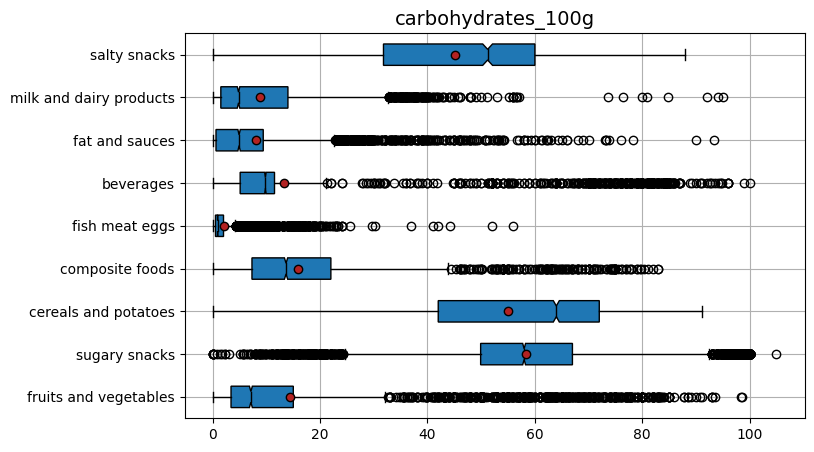

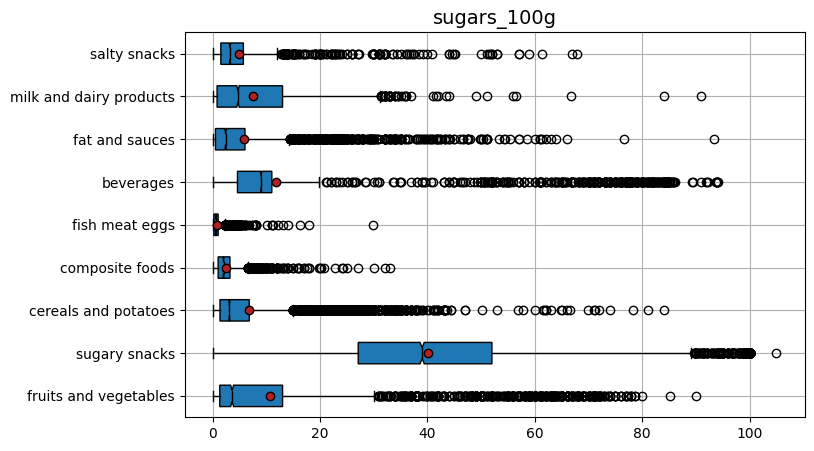

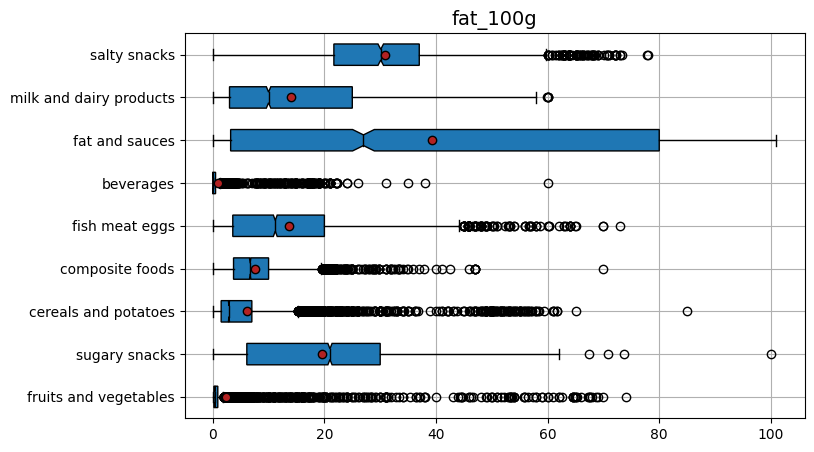

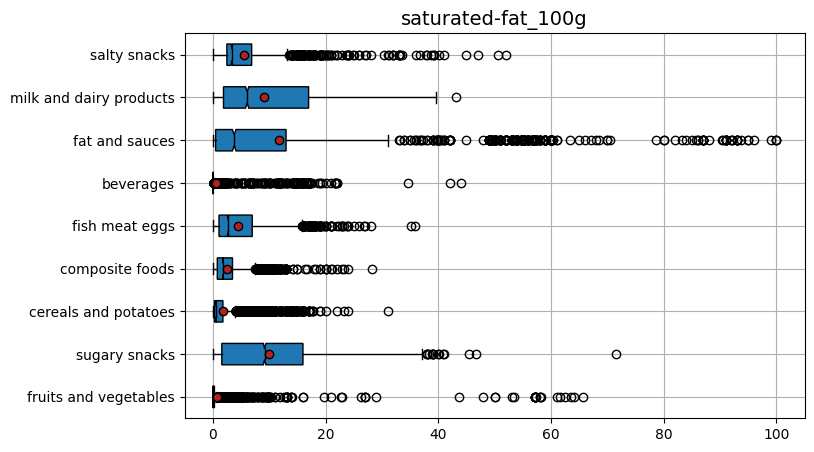

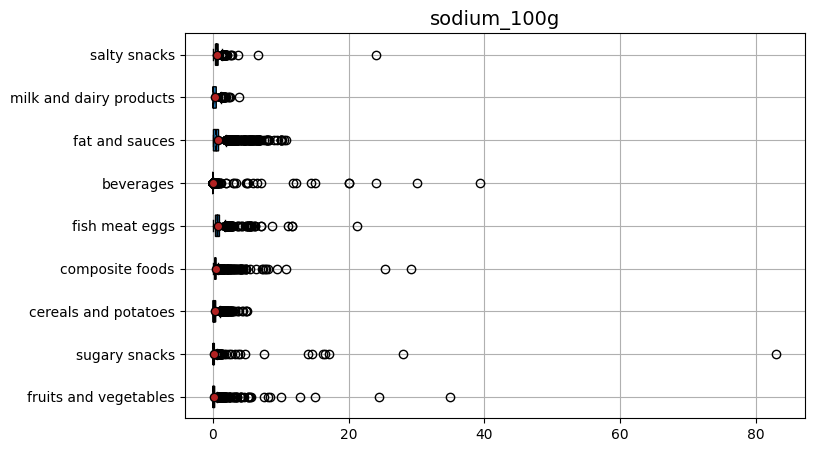

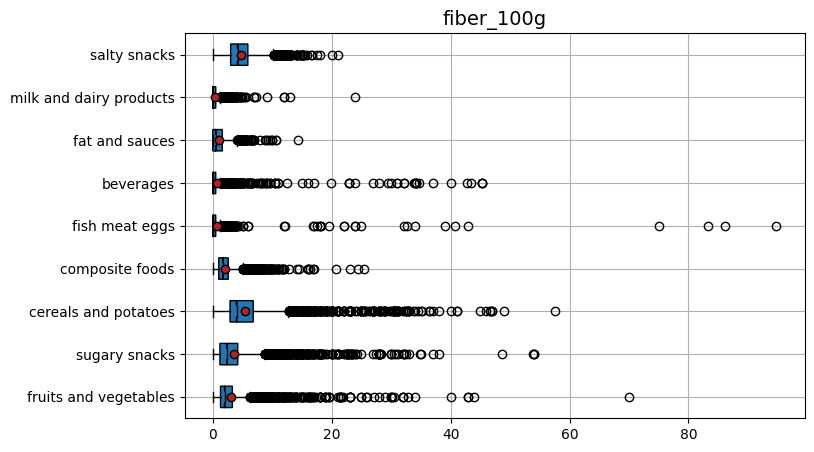

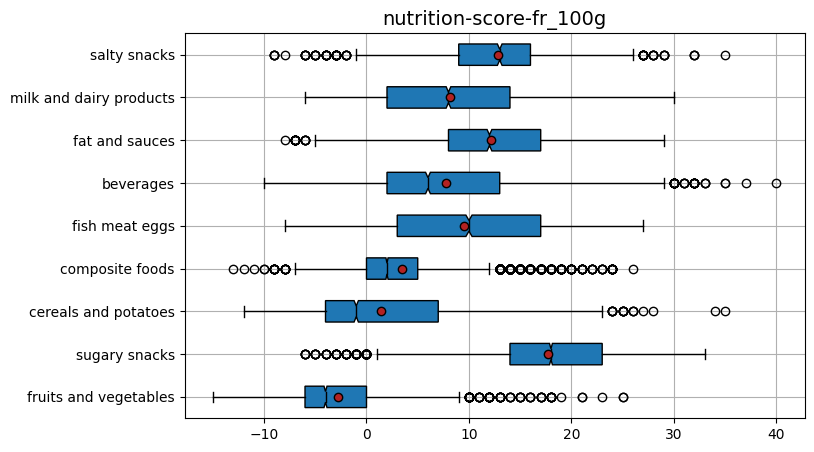

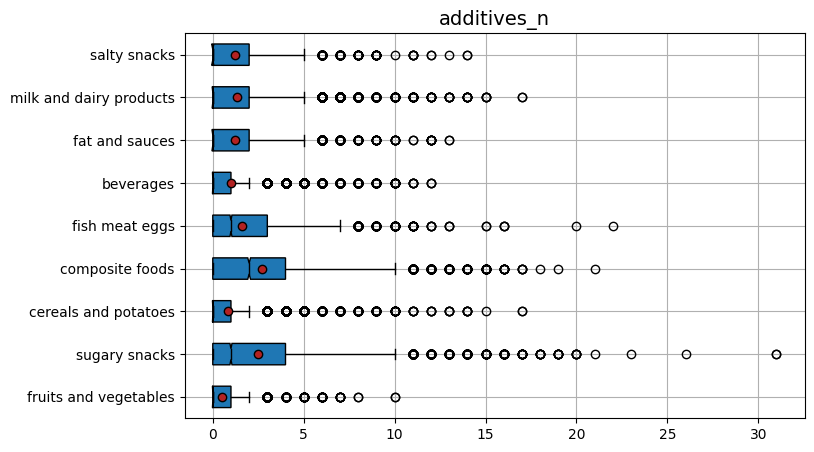

In [61]:
(categs, groupes, stats) = compute_stats(df_fix, col_categ, col_compos)
boxplots_per_categ(categs, groupes)

Après l'imputation :

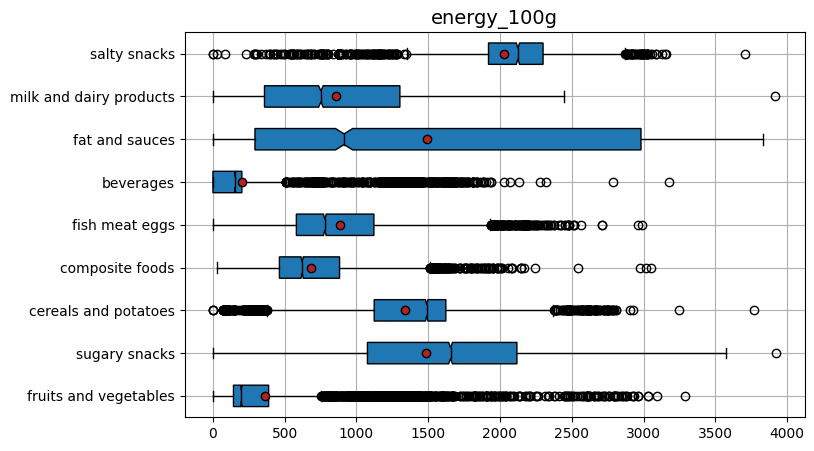

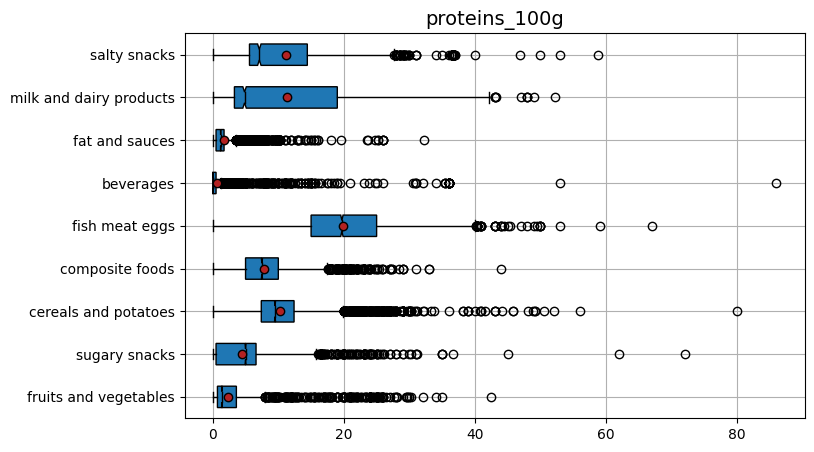

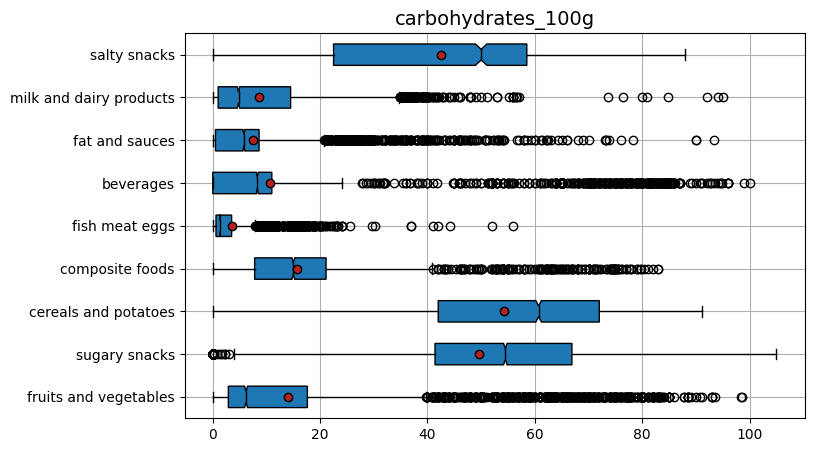

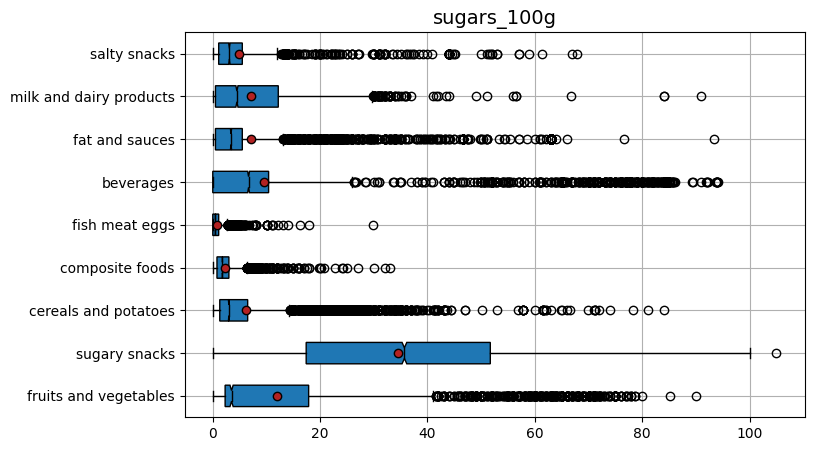

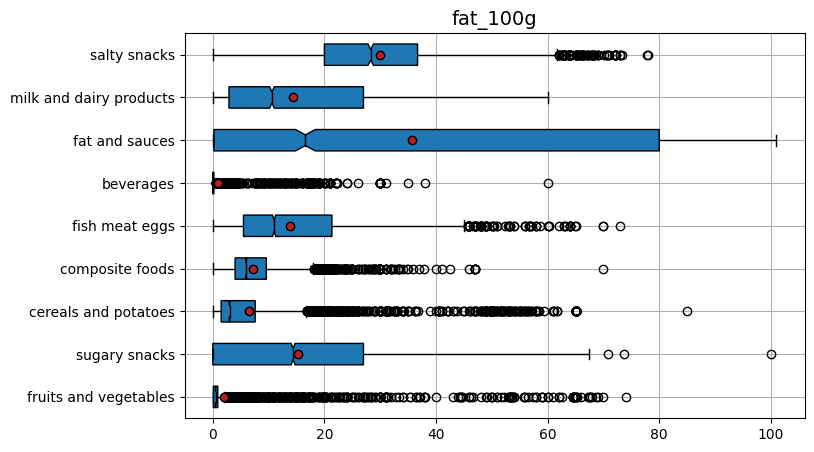

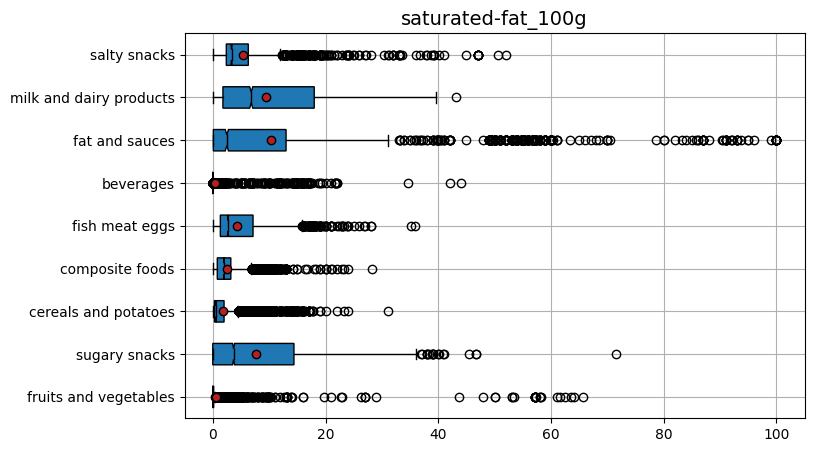

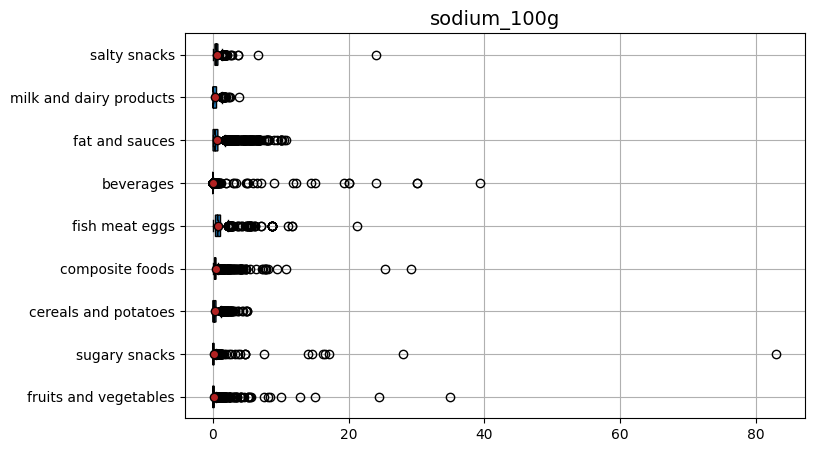

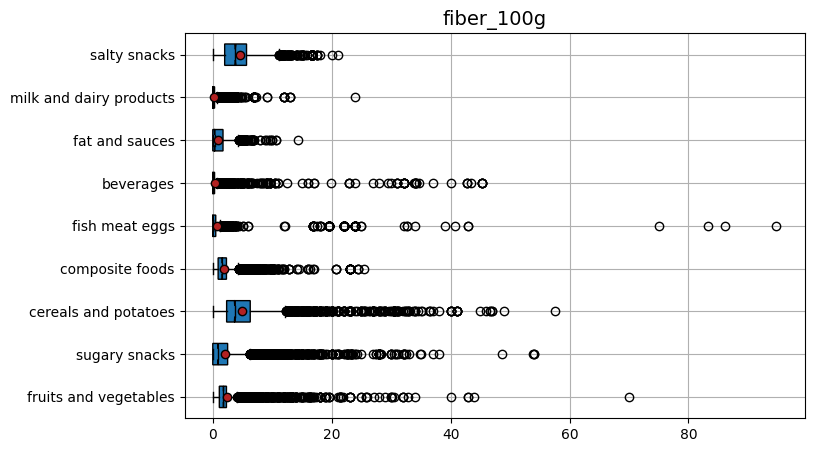

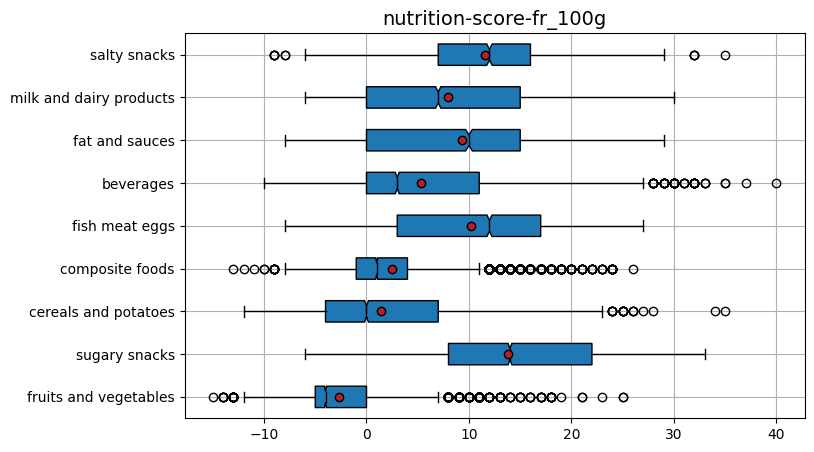

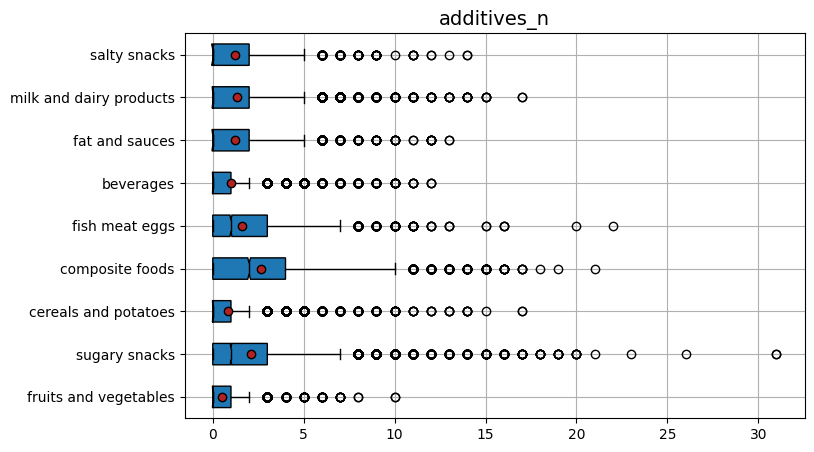

In [62]:
(categs, groupes_imp, stats_imp) = compute_stats(df_imp, col_categ, col_compos)
boxplots_per_categ(categs, groupes_imp)

Difficile de comparer les graphes 2 à 2, avant et après l'imputation. Tentons de rapprocher les 2 datasets et d'utiliser Seaborn :

In [63]:
groupes_nan_imp = groupes.copy()
df_fix2 = df_fix.copy()
df_fix2['filled'] = 'NO'

df_imp2 = df_imp.copy()
df_imp2['filled'] = 'YES'

df_nan_imp = pd.concat([df_fix2,df_imp2], axis=0)

In [64]:
import seaborn as sns

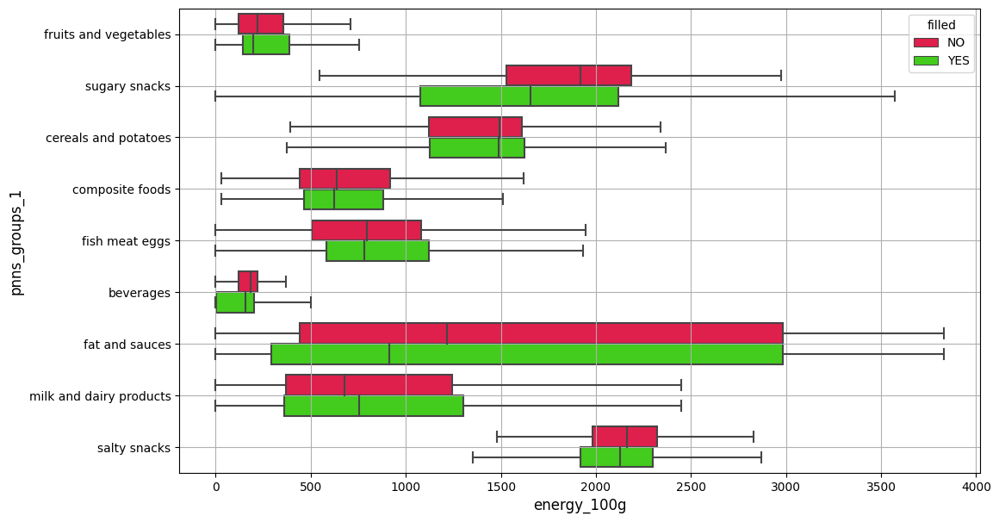

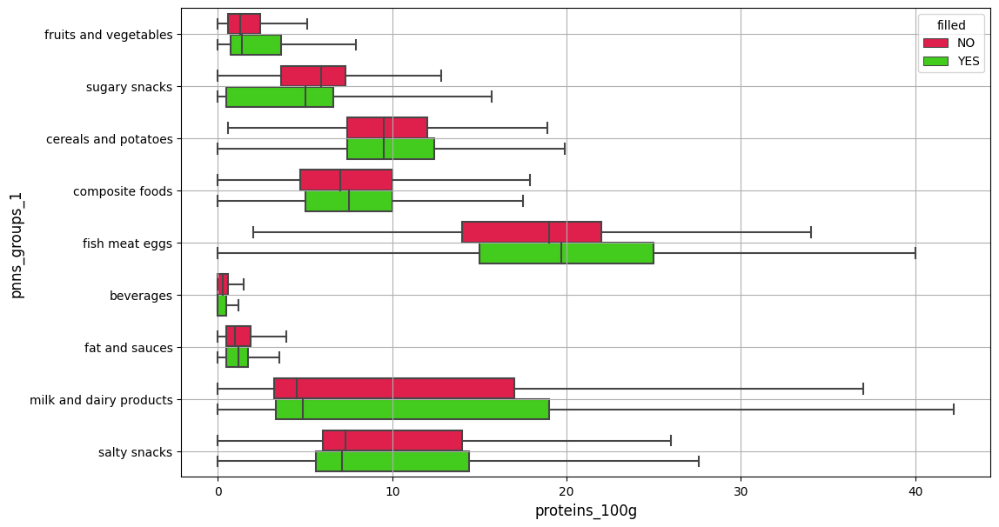

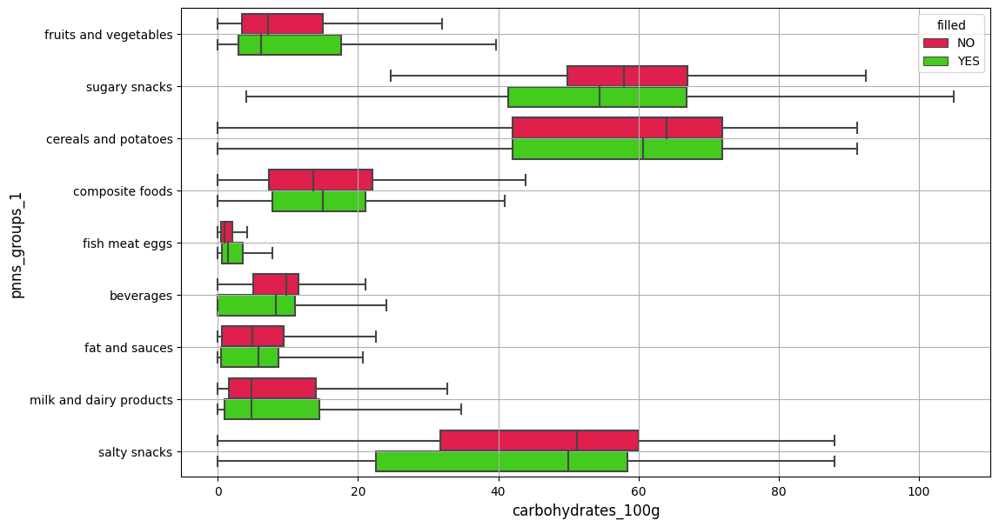

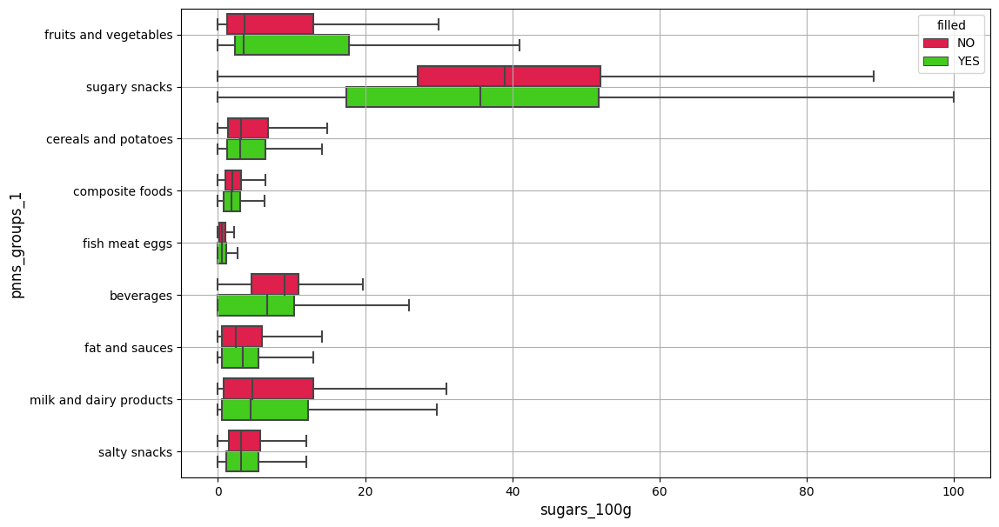

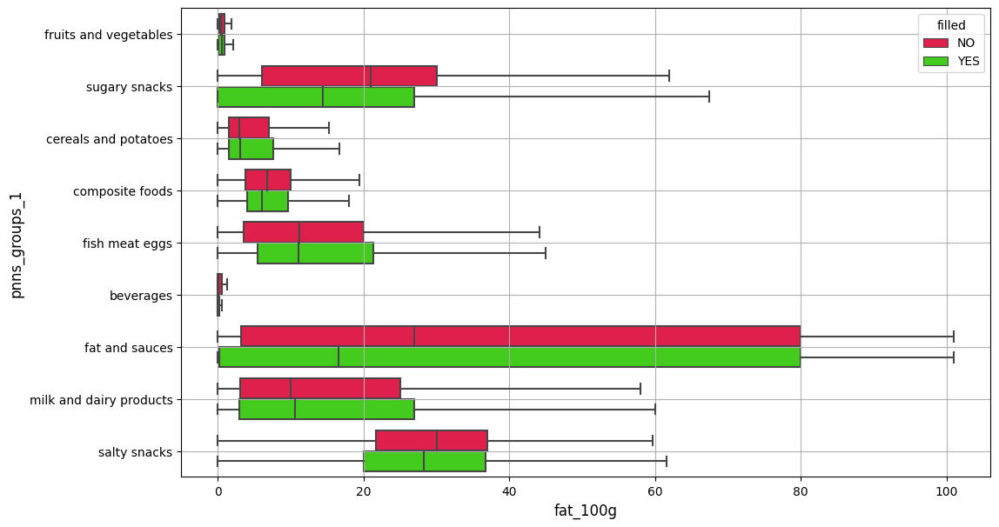

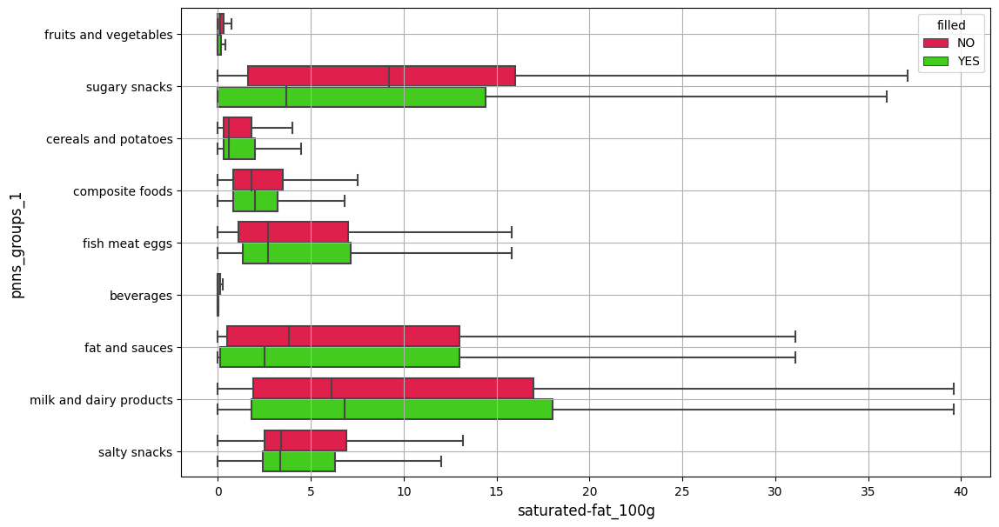

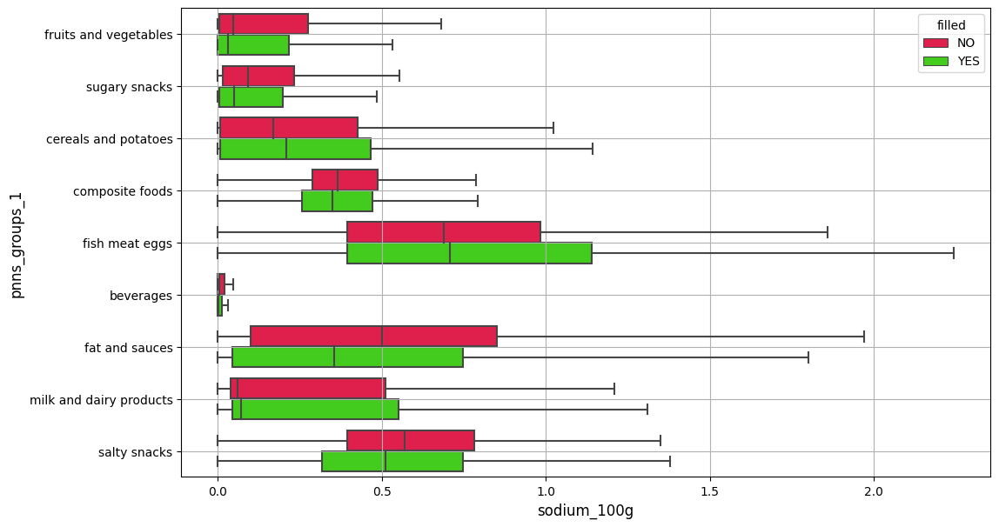

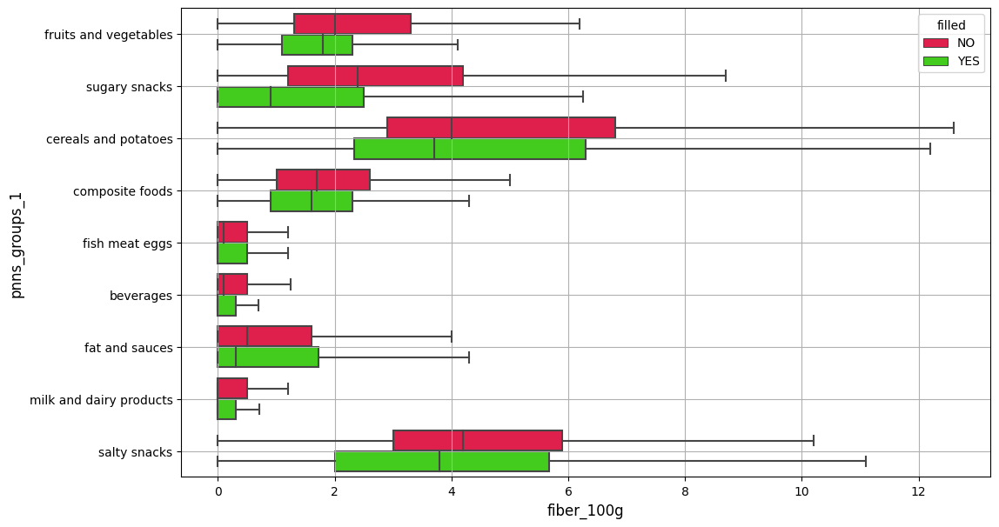

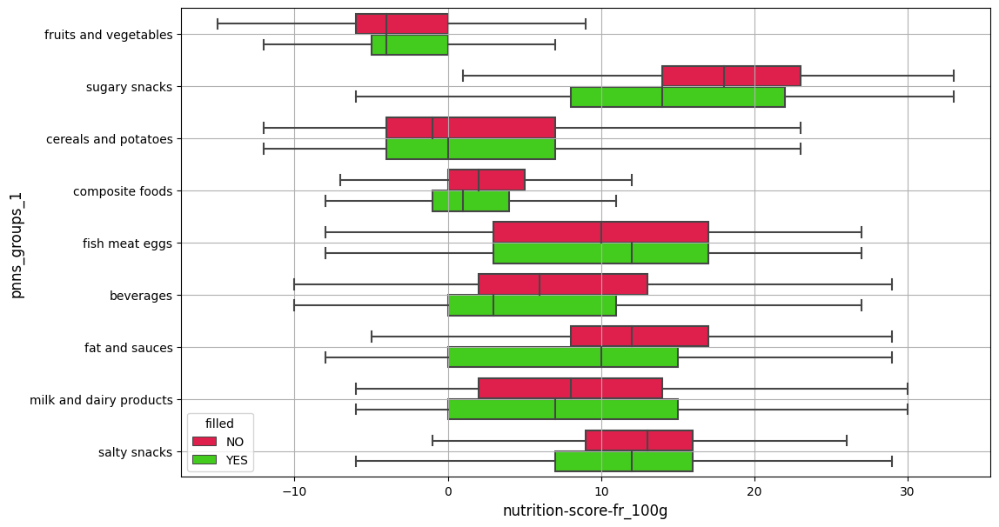

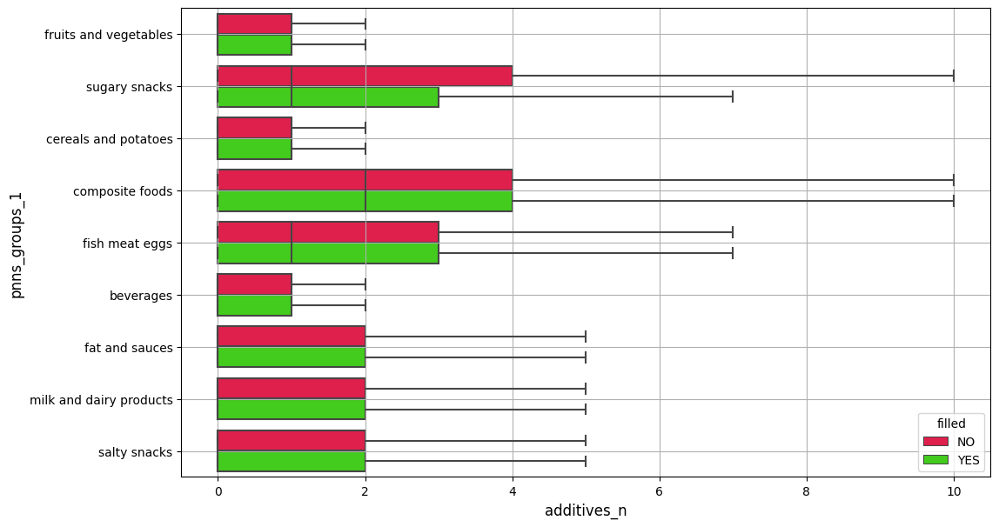

In [65]:
for nutr in num_cols:
    f, ax = plt.subplots(figsize=(12, 7))
    sns.boxplot(data=df_nan_imp, x=nutr, y='pnns_groups_1', hue='filled', palette='prism_r', showfliers = False) # 'gist_rainbow_r', width=0.8, notch=True
    plt.grid('on')

Les imputations ont légèrement perturbé les distributions en nutriments des différents groupes.

In [66]:
array = []
array_imp = []
for nutr in stats:
    for cat in stats[nutr]:
        row = [cat, nutr, stats[nutr][cat]['mean'], stats[nutr][cat]['std']]
        row_imp = [cat, nutr, stats_imp[nutr][cat]['mean'], stats_imp[nutr][cat]['std']]
        array.append(row)
        array_imp.append(row_imp)

table = pd.DataFrame(array, columns=[col_categ, 'nutriment', 'mean', 'std'])
table_imp = pd.DataFrame(array_imp, columns=[col_categ+' (imp)', 'nutriment (imp)', 'mean (imp)', 'std (imp)'])

table_nan_imp = pd.concat([table, table_imp], axis=1)
del(table_nan_imp[col_categ+' (imp)'])
del(table_nan_imp['nutriment (imp)'])

In [67]:
table_nan_imp.head(10)

,pnns_groups_1,nutriment,mean,std,mean (imp),std (imp)
0,fruits and vegetables,energy_100g,397.934985,499.627229,364.412444,442.201205
1,sugary snacks,energy_100g,1805.088560,502.517601,1485.873008,793.649038
2,cereals and potatoes,energy_100g,1356.303028,480.208704,1339.860233,488.640517
3,composite foods,energy_100g,689.500591,347.171251,681.776554,330.456751
4,fish meat eggs,energy_100g,865.432242,434.330602,884.262155,398.801476
5,beverages,energy_100g,269.227347,362.132437,200.317745,325.750570
6,fat and sauces,energy_100g,1616.239570,1257.026175,1488.634672,1306.557359
7,milk and dairy products,energy_100g,815.923180,499.156438,854.750807,530.674439
8,salty snacks,energy_100g,2117.822379,444.542885,2030.459786,523.106108
9,fruits and vegetables,proteins_100g,2.338633,3.815395,2.344037,3.276417


### Variables numériques Vs variables numériques 

Pairplots :

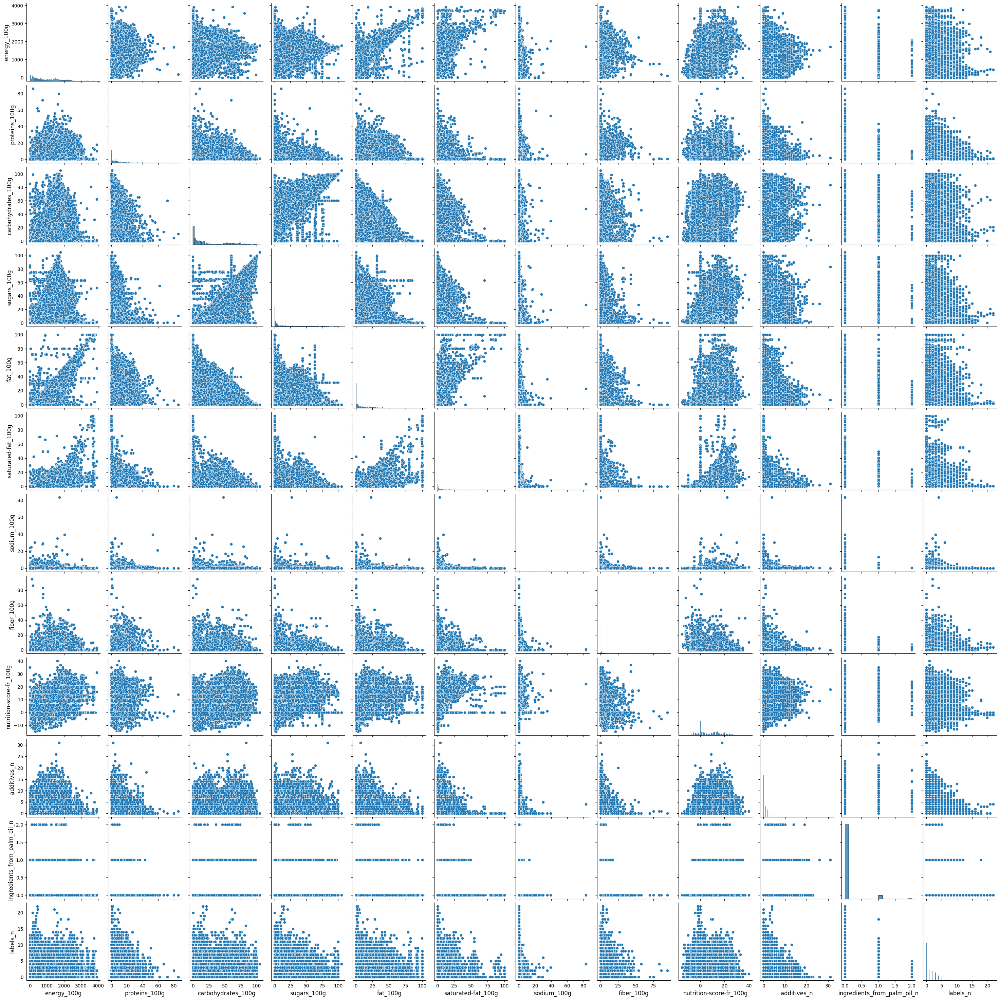

In [68]:
sns.pairplot(df_imp)

### Matrice des corrélations

In [69]:
df_imp.columns

Index(['product_name', 'brands', 'pnns_groups_1', 'pnns_groups_2',
       'energy_100g', 'proteins_100g', 'carbohydrates_100g', 'sugars_100g',
       'fat_100g', 'saturated-fat_100g', 'sodium_100g', 'fiber_100g',
       'nutrition-score-fr_100g', 'additives_n', 'ingredients_from_palm_oil_n',
       'labels_n', 'nutrition_grade_fr', 'additives_n_synth'],
      dtype='object')

In [70]:
df_imp.rename(columns={'ingredients_from_palm_oil_n': 'ingr_palm_oil_n'}, inplace=True)

C:\Users\a072108\AppData\Local\Temp\ipykernel_22248\1419082789.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correl = df_imp.corr(method='pearson')


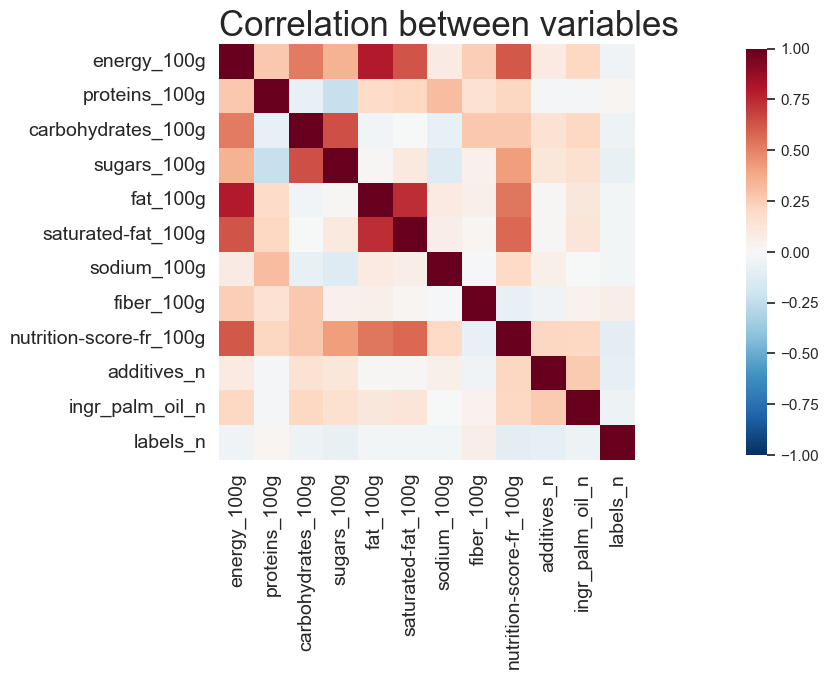

In [74]:
correl = df_imp.corr(method='pearson')
sns.set(font_scale=2)
sns.set(rc={'figure.facecolor': 'white'})
fig, ax = plt.subplots(figsize=(8, 8))
correl_final = sns.heatmap(correl, vmin=-1, vmax=1, cmap="RdBu_r", square=True, ax=ax,
                           cbar_kws={'orientation': 'vertical', 'pad': 0.18, 'shrink': 0.66})  # , center=0
correl_final.set_title('Correlation between variables', fontsize=25, loc='left');
correl_final.set_xticklabels(correl_final.get_xmajorticklabels(), fontsize=14);
correl_final.set_yticklabels(correl_final.get_ymajorticklabels(), fontsize=14);

On peut vérifier que :
- l'énergie est corrélée à la quantité de matière grasse totale(et dans une moindre mesure, à la quantité de matière grasse saturée), ainsi qu'à la quantité d'hydrates de carbone (sucres et sucres lents)
- le nutriscore (numérique) est corrélé à l'énergie, les MG saturées, les sucres rapides, et anti-corrélé à la quantité de fibres. Les protéines jouent un rôles plutôt neutre.

Intéressant :
- la quantité de protéines est anti-corrélée à la quantité de sucres rapides et lents (mais sûrement par concurrence de masse).
- la quantité de protéines est légèrement corrélée à la quantité de sodium (les produits protéinés sont des plats plus souvent salés ?)
- le nombre d'additifs et d'ingrédients issus d'huile de palme est **légèrement corrélé au nutriscore (numérique)** ⇒ Bien pour l'application.
- le nombre de labels est **légèrement anti-corrélé au nutriscore (numérique)** ⇒ Bien pour l'application.

In [75]:
correl['nutrition-score-fr_100g']

energy_100g                0.623025
proteins_100g              0.217881
carbohydrates_100g         0.272366
sugars_100g                0.420858
fat_100g                   0.533082
saturated-fat_100g         0.573384
sodium_100g                0.201413
fiber_100g                -0.078206
nutrition-score-fr_100g    1.000000
additives_n                0.211342
ingr_palm_oil_n            0.210440
labels_n                  -0.106380
Name: nutrition-score-fr_100g, dtype: float64

### Deux variables qualitatives

In [76]:
dq = df_imp.pivot_table(columns=['pnns_groups_2'],values=['pnns_groups_1'],aggfunc='count')

In [77]:
dq = df_imp[['pnns_groups_2', 'pnns_groups_1']].pivot_table(index=['pnns_groups_2'],
                                                            columns=['pnns_groups_1'], 
                                                            aggfunc=len, 
                                                            margins=True, margins_name="Total")

In [78]:
dq

pnns_groups_1,beverages,cereals and potatoes,composite foods,fat and sauces,fish meat eggs,fruits and vegetables,milk and dairy products,salty snacks,sugary snacks,Total
pnns_groups_2,,,,,,,,,,
alcoholic beverages,61.0,4.0,18.0,11.0,1.0,31.0,8.0,NaN,2430.0,2564
appetizers,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2054.0,NaN,2054
artificially sweetened beverages,250.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,250
biscuits and cakes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4512.0,4512
bread,NaN,1789.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1789
breakfast cereals,NaN,1373.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1373
cereals,NaN,4023.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4023
cheese,NaN,NaN,NaN,NaN,NaN,NaN,3932.0,NaN,NaN,3932
chocolate products,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3052.0,3052


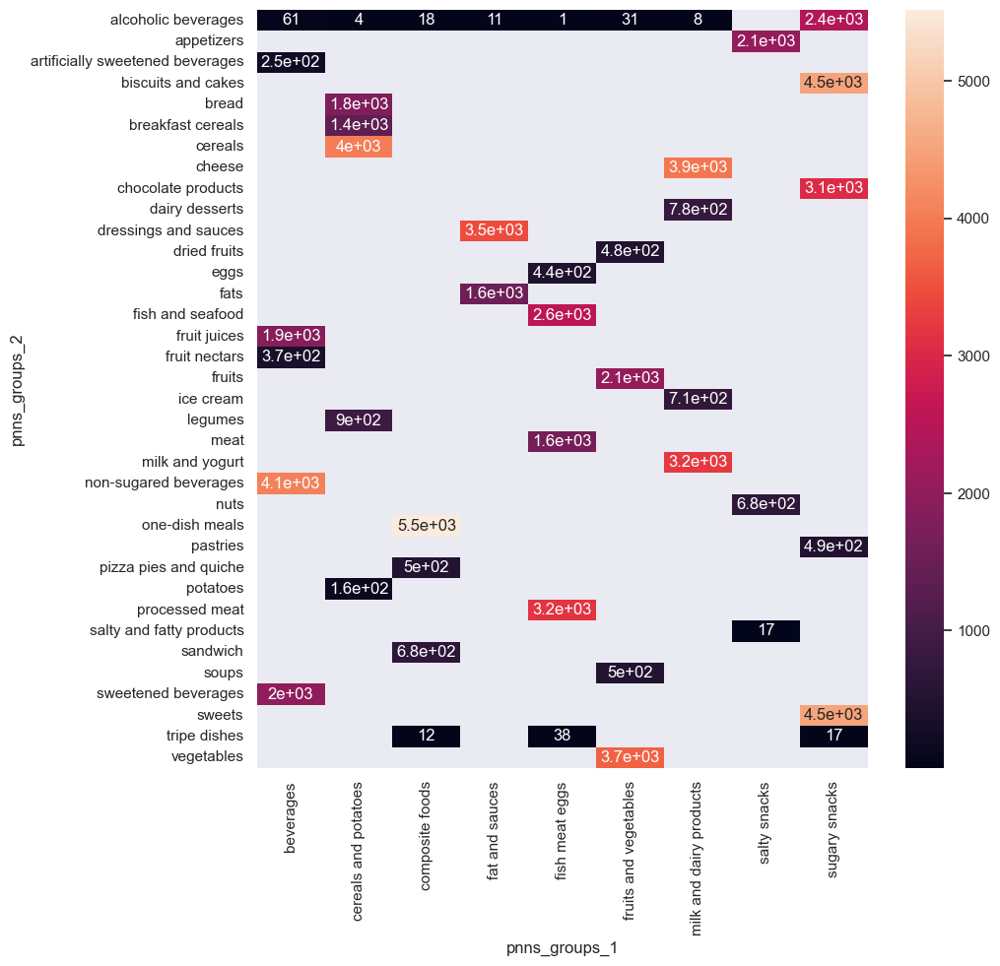

In [79]:
import seaborn as sns

plt.figure(figsize=(10,10))
tx = dq.loc[:,["Total"]]
ty = dq.loc[["Total"],:]
n = len(df_imp)
indep = tx.dot(ty) / n

c = dq.fillna(0)
measure = (c-indep)**2/indep
xi_n = measure.sum().sum()
table = measure/xi_n
sns.heatmap(dq.iloc[:-1,:-1],annot=c.iloc[:-1,:-1])
plt.show()

## Analyses explicatives avec ANOVA

In [80]:
def eta_squared(x,y):
    """
    x = qualitative
    y = quantitative
    """
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    SCR = None
    return (SCE/SCT, SCE, SCT, SCR)

### Entre le groupe `pnns_groups_1` et le NutriScore `nutrition-score-fr_100g`(numérique) 

##### Visualisation des distributions 

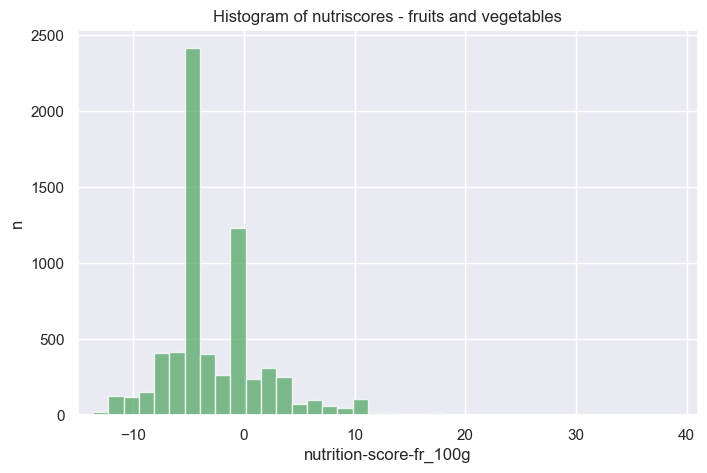

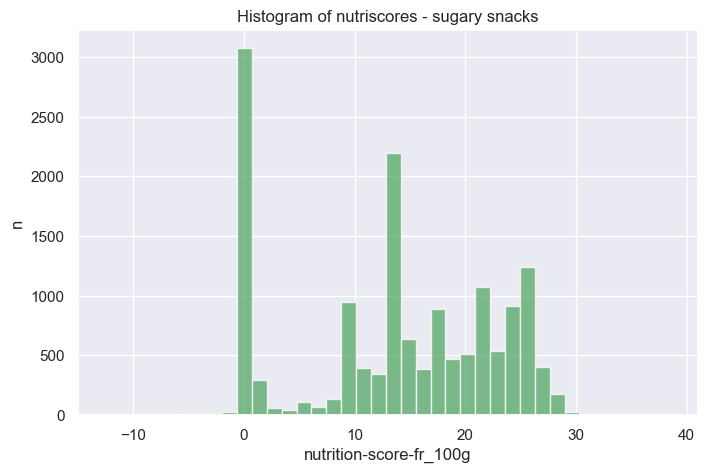

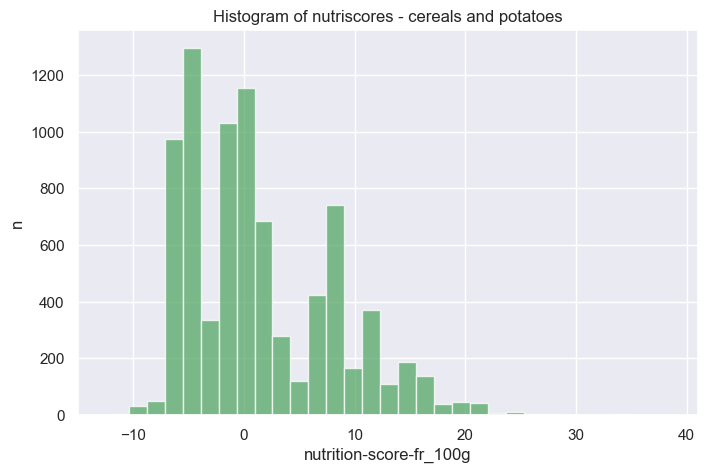

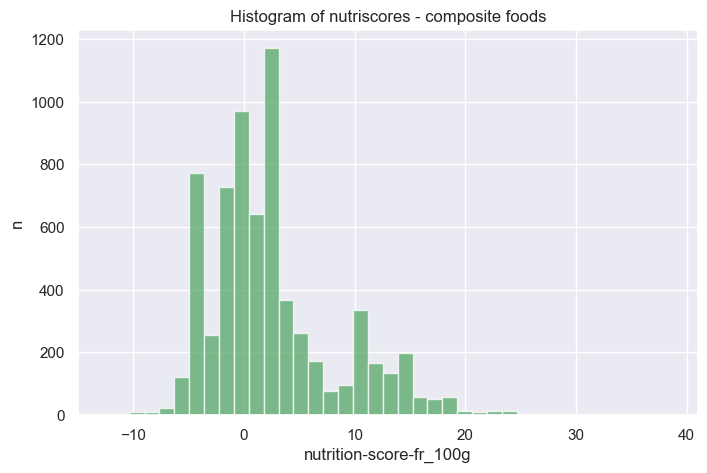

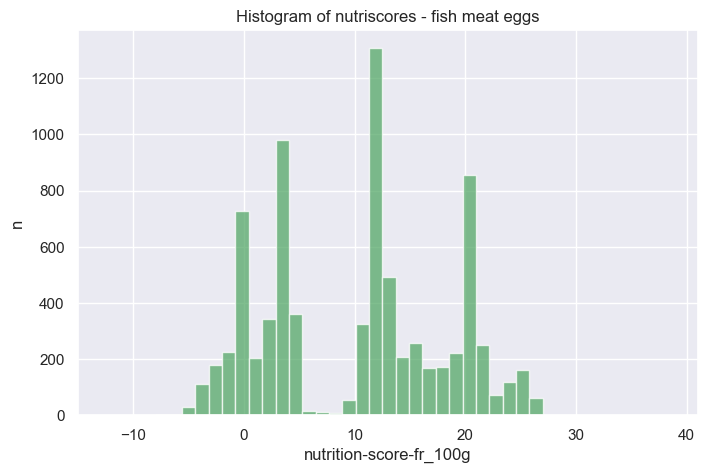

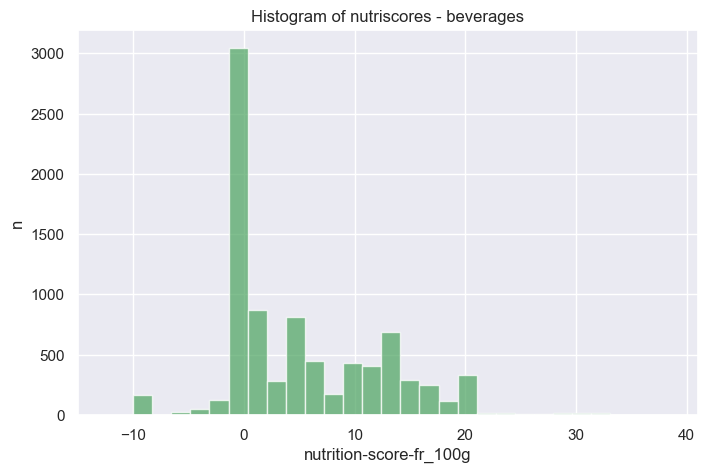

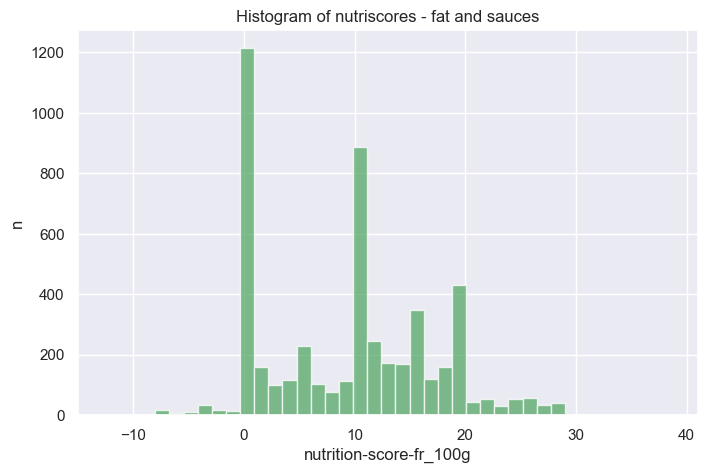

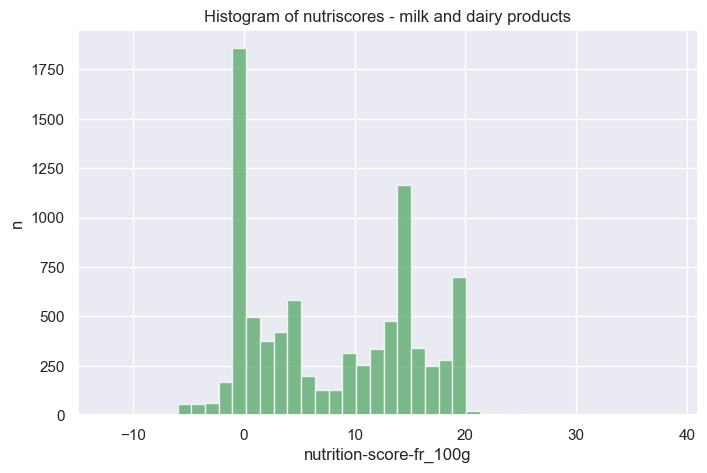

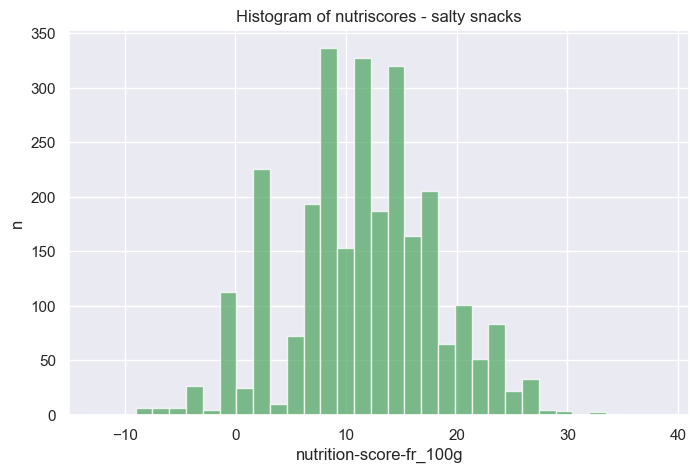

In [81]:
distr_pnns_1 = {}
for grp in df_imp['pnns_groups_1'].unique():
    vals = df_imp.loc[(df_imp['pnns_groups_1']==grp), 'nutrition-score-fr_100g'].values
    z  = StandardScaler().fit_transform(vals.reshape(-1, 1))
    distr_pnns_1[grp] = vals
    n, bins, patches = plt.hist(vals, 29, density=False, facecolor='g', alpha=0.75)
    plt.xlabel('nutrition-score-fr_100g')
    plt.ylabel('n')
    plt.title(f'Histogram of nutriscores - {grp}')
    plt.xlim(-15, 41)
    plt.grid(True)
    plt.show()

Visuellement, les distributions de nutriscore éligibles à une loi normale sont les groupes d'aliments :
```
'fruits and vegetables'
'fish meat eggs'
'salty snacks'
```

In [82]:
grps_norm = ['fruits and vegetables',
             'fish meat eggs',
             'salty snacks']

##### Indépendance des expériences

On est obligé de supposer que les produits saisis par les consommateurs l'ont été de manière indépendante :
 - pas de dépendance entre ce que saisissent les différents consommateurs
 - suffisamment de consommateurs et de produits entrés pour que la répartition des produits avec différents NutriScores et différentes catégories `pnns_groups_1` soit bien représentative
 - pas de catégories apparues tardivement, de saisies séquentielles, etc.

#### Vérification des hypothèses

##### Test de Shapiro-Wilk

On teste l'hypothèse nulle : $H_0$ = "les distributions de chaque groupe d'aliments dans `pnns_groups_1` sont normales".

In [83]:
from scipy.stats import shapiro, kstest, kruskal

In [84]:
for grp in df_imp['pnns_groups_1'].unique():
    print(bcolors.BOLD+grp+bcolors.ENDC)
    x = df_imp.loc[df_imp['pnns_groups_1']==grp,'nutrition-score-fr_100g'].values
    x = StandardScaler().fit_transform(x.reshape(-1, 1))
    n = len(x)
    if n>5000:
        n=5000
    W, p = shapiro(x[0:n])
    print(f' n = {n}')
    print(f' W = {W:.3f}')
    print(f' p = {p:.12f}')    

fruits and vegetables
 n = 5000
 W = 0.931
 p = 0.000000000000
sugary snacks
 n = 5000
 W = 0.919
 p = 0.000000000000
cereals and potatoes
 n = 5000
 W = 0.920
 p = 0.000000000000
composite foods
 n = 5000
 W = 0.907
 p = 0.000000000000
fish meat eggs
 n = 5000
 W = 0.942
 p = 0.000000000000
beverages
 n = 5000
 W = 0.889
 p = 0.000000000000
fat and sauces
 n = 5000
 W = 0.940
 p = 0.000000000000
milk and dairy products
 n = 5000
 W = 0.914
 p = 0.000000000000
salty snacks
 n = 2748
 W = 0.994
 p = 0.000000001292


La valeur de $W$ la plus basse est $0.89$ pour les `'beverages'`. La valeur de $n$ sort des tables connues (50 ci-dessous, et 5000 pour `scipy`), mais on sent que $W$ doit être beaucoup plus proche de $1.$ que ce que l'on observe. 

Concernant la <i>p-value</i>, celle-ci est **nulle ou quasiment nulle** pour chaque groupe d'aliments, ce qui signifie que la probabilité de rejeter $H_0$ à tort est nulle, et donc que l'on doit **rejeter** cette hyptohèse. 

![](http://www.biostat.ulg.ac.be/pages/Site_r/normalite_files/table-W.png)

**Les distributions du nutriscore numérique par groupe d'aliments `pnns_groups_1` ne sont donc pas normales.**

##### Test de Kolmogorov-Smirnov

Teste la normalité des distributions, pour des échantillons de grande taille (ce que ne sait pas gérer le test de Shapiro-Wilk).
http://www.biostat.ulg.ac.be/pages/Site_r/Normalite.html
Le test de Shapiro-Wilk étant négatif, on réalise ce test par exercice 😉.

In [85]:
from sklearn.preprocessing import StandardScaler

In [87]:
for grp in df_imp['pnns_groups_1'].unique():
    print(bcolors.BOLD+grp+bcolors.ENDC)
    x = df_imp.loc[df_imp['pnns_groups_1']==grp,'nutrition-score-fr_100g'].values
    n = len(x)
    x = StandardScaler().fit_transform(x.reshape(-1, 1))
    K, p = kstest(x,'norm')
    seuil = 0.886/math.sqrt(n)
    print(f' K = {K:.3f} | threshold = {seuil:.12f}')
    print(f' p = {p:.12f}')    

fruits and vegetables
 K = 1.000 | threshold = 0.010766517414
 p = 0.000000000000
sugary snacks
 K = 0.985 | threshold = 0.007229101106
 p = 0.000000000000
cereals and potatoes
 K = 1.000 | threshold = 0.009754538959
 p = 0.000000000000
composite foods
 K = 1.000 | threshold = 0.010804878049
 p = 0.000000000000
fish meat eggs
 K = 0.988 | threshold = 0.009968909766
 p = 0.000000000000
beverages
 K = 1.000 | threshold = 0.009552317749
 p = 0.000000000000
fat and sauces
 K = 0.995 | threshold = 0.012494995020
 p = 0.000000000000
milk and dairy products
 K = 0.999 | threshold = 0.009514239668
 p = 0.000000000000
salty snacks
 K = 1.000 | threshold = 0.016901504201
 p = 0.000000000000


Cet autre test confirme que les distributions ne sont **pas normales**.

##### Homogénéité des variances

Ce test n'est plus applicable suite aux premiers tests sur la normalité.

#### Tests sur d'autres variables numériques

In [88]:
num_cols

['energy_100g',
 'proteins_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fat_100g',
 'saturated-fat_100g',
 'sodium_100g',
 'fiber_100g',
 'nutrition-score-fr_100g',
 'additives_n']

In [89]:
def shapiro_custo(df_imp,categ):
    au_moins_une_dist_normale = False
    for var in num_cols:
        for grp in df_imp[categ].unique():
            x = df_imp.loc[df_imp[categ]==grp,var].values
            x = StandardScaler().fit_transform(x.reshape(-1, 1))
            n = len(x)
            if n>5000:
                n=5000

            W, p = shapiro(x[0:n])
            if p>=0.05:
                au_moins_une_dist_normale = True
                print(bcolors.BOLD+bcolors.OKGREEN+var+'\n'+'-'*len(var)+bcolors.ENDC)
                print(bcolors.BOLD+' Finally a normal distribution!! → '+bcolors.OKCYAN+grp+bcolors.ENDC)
                print(f'  n = {n}')
                print(f'  W = {W:.3f}')
                print(f'  p = {p:.12f}')
                print('')
    if not au_moins_une_dist_normale:
        s = f"No normal distribution for the categorical variable '{categ}'"
        print(bcolors.BOLD+bcolors.FAIL+s+'\n'+'-'*len(s)+bcolors.ENDC)
    return au_moins_une_dist_normale

In [90]:
au_moins_une_dist_normale = shapiro_custo(df_imp, 'pnns_groups_1')

No normal distribution for the categorical variable 'pnns_groups_1'
-------------------------------------------------------------------


Aucune grandeur numérique ne suit correctement une loi normale en fonction de `pnns_groups_1` ! 

Essayons `pnns_groups_2` :

In [91]:
au_moins_une_dist_normale = shapiro_custo(df_imp,'pnns_groups_2')

proteins_100g
-------------
 Finally a normal distribution!! → salty and fatty products
  n = 17
  W = 0.950
  p = 0.454365700483

saturated-fat_100g
------------------
 Finally a normal distribution!! → salty and fatty products
  n = 17
  W = 0.900
  p = 0.067494124174

sodium_100g
-----------
 Finally a normal distribution!! → salty and fatty products
  n = 17
  W = 0.964
  p = 0.702906787395

fiber_100g
----------
 Finally a normal distribution!! → salty and fatty products
  n = 17
  W = 0.970
  p = 0.813648462296



Le test de Shapiro-Wilk ne fait ressortir **qu'une seule distribution normale**, ce qui va limiter l'application de l'ANOVA.

Essayons le test de **Kolmogorov-Smirnov** :

In [93]:
def ks_custo(df_imp, categ):
    au_moins_une_dist_normale = False
    for var in num_cols:
        for grp in df_imp[categ].unique():
            x = df_imp.loc[df_imp[categ]==grp,var].values
            n = len(x)
            x = StandardScaler().fit_transform(x.reshape(-1, 1))
            K, p = kstest(x,'norm')
            seuil = 0.886/math.sqrt(n)
            if K <= seuil or p >= 0.05:
                au_moins_une_dist_normale = True
                print(bcolors.BOLD+bcolors.OKGREEN+var+'\n'+'-'*len(var)+bcolors.ENDC)
                print(bcolors.BOLD+' Finally a normal distribution!! → '+bcolors.OKCYAN+grp+bcolors.ENDC)
                print(f' K = {K:.3f} | threshold = {seuil:.12f}')
                print(f' p = {p:.12f}')
    if not au_moins_une_dist_normale:
        s = f"No normal distribution for the categorical variable '{categ}'"
        print(bcolors.BOLD+bcolors.FAIL+s+'\n'+'-'*len(s)+bcolors.ENDC)
    return au_moins_une_dist_normale

In [94]:
au_moins_une_dist_normale = ks_custo(df_imp, 'pnns_groups_2')

No normal distribution for the categorical variable 'pnns_groups_2'
-------------------------------------------------------------------


#### ANOVA de Kruskal-Wallis

In [97]:
def kruskal_custo(df_imp, categ, num_cols):
    distrib_egales = False
    for var in num_cols:
        print(bcolors.BOLD+bcolors.OKGREEN+var+'\n'+'-'*len(var)+bcolors.ENDC)

        H, p = kruskal(*[df_imp.loc[df_imp[categ]==grp,var].values for grp in df_imp[categ].unique()])
        print(f'  H = {H:.3f}') # | seuil = {seuil:.12f}')
        print(f'  p = {p:.12f}')

        if p<0.05: # or H >= seuil:
            distrib_egales = False
            print(f"H0 rejected, the distributions are significantly different for the categorical variable '{categ}'")
        else:
            distrib_egales = True
        print('')
    return distrib_egales

In [98]:
distrib_egales = kruskal_custo(df_imp, 'pnns_groups_1', num_cols)

energy_100g
-----------
  H = 29181.220
  p = 0.000000000000
H0 rejected, the distributions are significantly different for the categorical variable 'pnns_groups_1'

proteins_100g
-------------
  H = 41574.728
  p = 0.000000000000
H0 rejected, the distributions are significantly different for the categorical variable 'pnns_groups_1'

carbohydrates_100g
------------------
  H = 30459.977
  p = 0.000000000000
H0 rejected, the distributions are significantly different for the categorical variable 'pnns_groups_1'

sugars_100g
-----------
  H = 18625.921
  p = 0.000000000000
H0 rejected, the distributions are significantly different for the categorical variable 'pnns_groups_1'

fat_100g
--------
  H = 23085.332
  p = 0.000000000000
H0 rejected, the distributions are significantly different for the categorical variable 'pnns_groups_1'

saturated-fat_100g
------------------
  H = 24100.365
  p = 0.000000000000
H0 rejected, the distributions are significantly different for the categorical vari

In [99]:
distrib_egales = kruskal_custo(df_imp,'pnns_groups_2',num_cols)

energy_100g
-----------
  H = 53537.613
  p = 0.000000000000
H0 rejected, the distributions are significantly different for the categorical variable 'pnns_groups_2'

proteins_100g
-------------
  H = 55331.490
  p = 0.000000000000
H0 rejected, the distributions are significantly different for the categorical variable 'pnns_groups_2'

carbohydrates_100g
------------------
  H = 55417.497
  p = 0.000000000000
H0 rejected, the distributions are significantly different for the categorical variable 'pnns_groups_2'

sugars_100g
-----------
  H = 49739.359
  p = 0.000000000000
H0 rejected, the distributions are significantly different for the categorical variable 'pnns_groups_2'

fat_100g
--------
  H = 45220.446
  p = 0.000000000000
H0 rejected, the distributions are significantly different for the categorical variable 'pnns_groups_2'

saturated-fat_100g
------------------
  H = 46741.287
  p = 0.000000000000
H0 rejected, the distributions are significantly different for the categorical vari

### Entre le nutrigrade `nutrition_grade_fr` et les différents nutriments 

##### Visualisation des distributions 

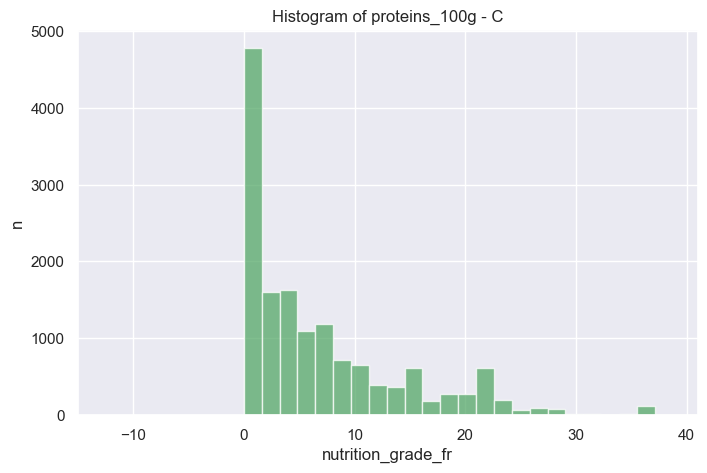

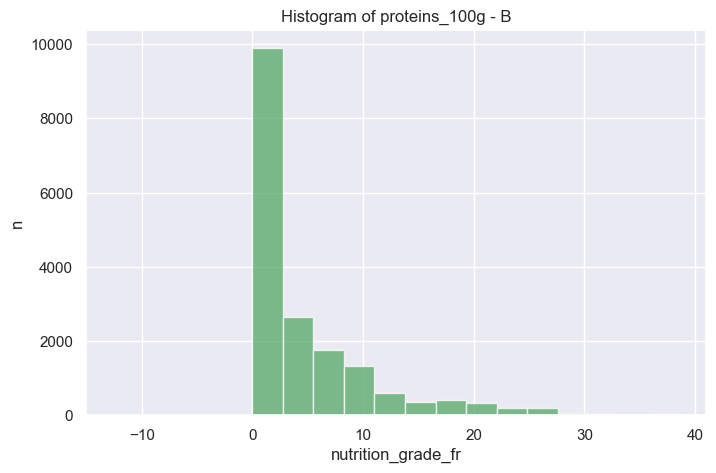

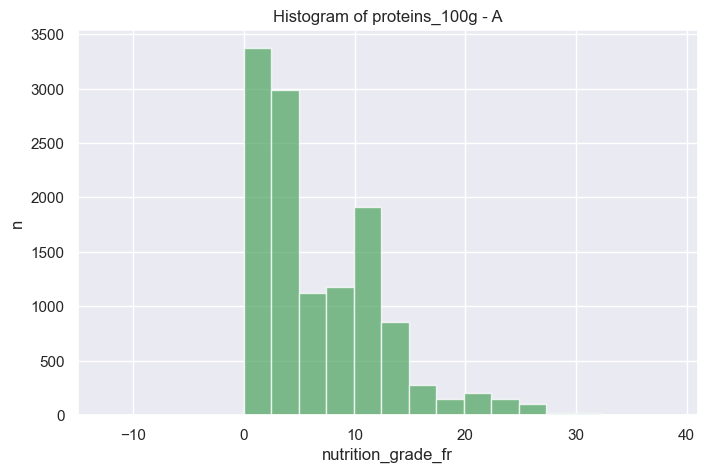

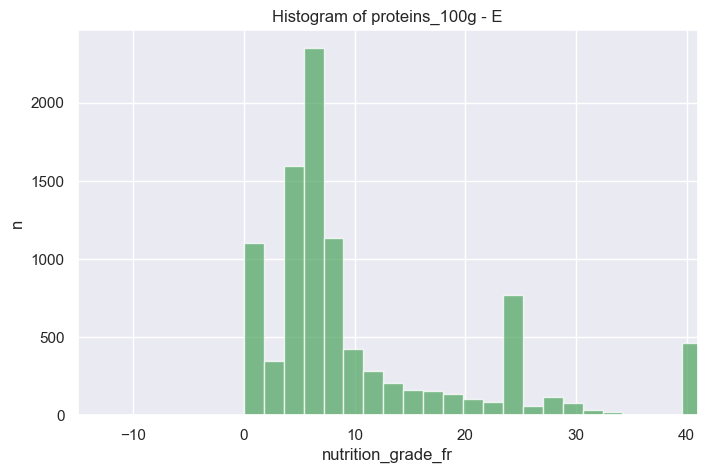

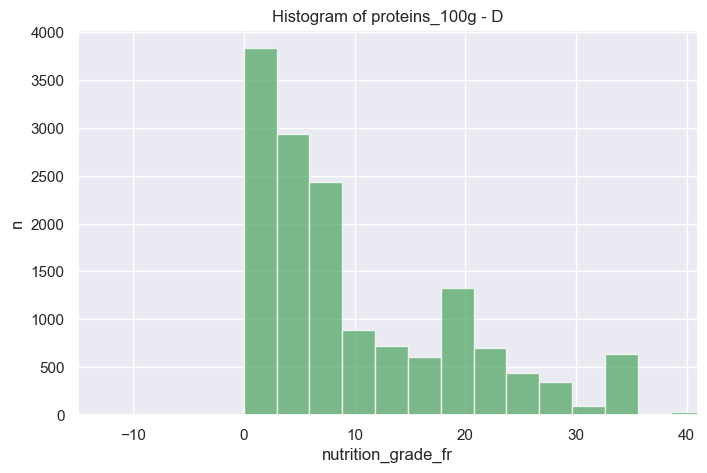

In [100]:
distr_pnns_1 = {}
for grp in df_imp['nutrition_grade_fr'].unique():
    vals = df_imp.loc[(df_imp['nutrition_grade_fr']==grp), 'proteins_100g'].values
    z  = StandardScaler().fit_transform(vals.reshape(-1, 1))
    distr_pnns_1[grp] = vals
    n, bins, patches = plt.hist(vals, 29, density=False, facecolor='g', alpha=0.75)
    plt.xlabel('nutrition_grade_fr')
    plt.ylabel('n')
    plt.title(f'Histogram of proteins_100g - {grp}')
    plt.xlim(-15, 41)
    plt.grid(True)
    plt.show()

Les distributions ne sont pas symétriques, mais cela n'exclut pas qu'elles soient normales.

#### Vérification des hypothèses

##### Test de Shapiro-Wilk

On teste l'hypothèse nulle : $H_0$ = "les distributions de chaque score dans `nutrition_grade_fr` sont normales".

In [101]:
au_moins_une_dist_normale = shapiro_custo(df_imp, 'nutrition_grade_fr')

No normal distribution for the categorical variable 'nutrition_grade_fr'
------------------------------------------------------------------------


Aucune variable ne suit une loi normale, pour les catégories de nutrigrade.

#### Mise en oeuvre de l'ANOVA standard

Si les distributions avaient été normales, nous aurions procédé aux tests suivants :

In [103]:
(eta2, SCE, SCT, SCR) = eta_squared(df_imp['pnns_groups_1'], df_imp['nutrition-score-fr_100g']) # qualitative, quantitative

In [104]:
eta2

0.33587421154495056

On aurait pu conclure que la relation entre le nutriscore (numérique) et le groupe principal d'aliments PNNS1 est assez nette. 

In [105]:
eta_squared(df_imp['pnns_groups_2'], df_imp['nutrition-score-fr_100g'])

(0.5641945760344294, 3214962.5226224586, 5698322.279557451, None)

Relation encore plus nette entre PNNS2 et le NS.

Hypothèse nulle = toutes les moyennes sont égales. Test d'hypothèse nulle : on calcule la F-value :

In [106]:
from scipy import stats

In [107]:
grps = pd.unique(df_imp['pnns_groups_1'].values)
df_grp = {grp:df_imp['pnns_groups_1'][df_imp['pnns_groups_1']==grp] for grp in grps}

In [108]:
F, p = stats.f_oneway(*[df_imp.loc[df_imp['pnns_groups_1']==grp, 'nutrition-score-fr_100g'] for grp in grps])

In [109]:
F

4406.755456830115

F a une valeur très élevée, ce qui signinfie que la variance inter-classe est nettement plus élevée que la variance intra-classe.

In [110]:
p

0.0

Une p-value de 0. signifie que l'on n'a aucune chance de rejeter l'hypothèse nulle à tort. L'ANOVA standard aurait donné la bonne conclusion si les distributions avaient été normales.

### Pour l'application : ANOVA de Kruskal-Wallis sur NutriScore → additifs, huile de palme, labels

In [111]:
df2 = df_imp[['nutrition_grade_fr', 'additives_n',
              'ingr_palm_oil_n', 'labels_n']].copy()
num_cols2 = ['additives_n', 'ingr_palm_oil_n', 'labels_n']

In [112]:
distrib_egales = kruskal_custo(df2,'nutrition_grade_fr',num_cols2)

additives_n
-----------
  H = 5105.988
  p = 0.000000000000
H0 rejected, the distributions are significantly different for the categorical variable 'nutrition_grade_fr'

ingr_palm_oil_n
---------------
  H = 3093.359
  p = 0.000000000000
H0 rejected, the distributions are significantly different for the categorical variable 'nutrition_grade_fr'

labels_n
--------
  H = 725.046
  p = 0.000000000000
H0 rejected, the distributions are significantly different for the categorical variable 'nutrition_grade_fr'



## Analyses multivariées

### Analyse en Composantes Principales (ACP)

In [113]:
from sklearn import decomposition
from sklearn import preprocessing

In [114]:
num_cols = [
    'energy_100g',
    'proteins_100g',
    'carbohydrates_100g',
    'sugars_100g',
    'fat_100g',
    'saturated-fat_100g',
    'sodium_100g',
    'fiber_100g',
    'nutrition-score-fr_100g',
    'additives_n',
    'ingr_palm_oil_n',
    'labels_n'
]

In [115]:
Xpca = df_imp[num_cols].values

In [116]:
df_imp

,product_name,brands,pnns_groups_1,pnns_groups_2,energy_100g,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fiber_100g,nutrition-score-fr_100g,additives_n,ingr_palm_oil_n,labels_n,nutrition_grade_fr,additives_n_synth
0,Salade Cesar,Kirkland Signature,fruits and vegetables,vegetables,1210.0,22.00,23.00,0.00,12.00,7.00,0.850,2.00,6.0,0,0,0,C,0
1,Danoises à la cannelle roulées,Kirkland Signature,sugary snacks,biscuits and cakes,1520.0,4.79,54.10,28.10,14.40,8.50,0.363,2.05,0.0,10,0,0,B,10+
2,Flute,Waitrose,cereals and potatoes,bread,1170.0,9.30,51.20,6.98,2.33,0.00,0.465,2.33,1.0,0,0,0,B,0
3,Chaussons tressés aux pommes,Kirkland Signature,sugary snacks,biscuits and cakes,1090.0,3.33,38.70,24.70,10.70,2.00,0.255,2.00,9.0,5,0,0,C,5
4,lentilles vertes,Bertrand Lejeune,cereals and potatoes,legumes,331.0,4.76,15.08,0.79,0.00,0.00,0.262,6.30,-5.0,0,0,3,A,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69712,Banane,Pago,beverages,fruit nectars,263.0,0.50,14.60,14.40,0.50,0.10,0.100,0.40,20.0,1,0,0,E,1
69713,Orange Juice,Coles,beverages,fruit juices,165.0,1.00,9.00,7.10,1.00,1.00,0.001,1.00,0.0,0,0,6,B,0
69714,Premium Tasmanian Salmon,Tassal,fish meat eggs,fish and seafood,661.0,19.30,3.51,0.00,7.02,1.75,1.140,0.00,12.0,0,0,2,D,0
69715,Lemon Lime & Bitters,Schweppes,beverages,sweetened beverages,177.0,0.00,10.40,10.40,0.00,0.00,0.010,0.00,13.0,0,0,0,D,0


In [117]:
names = df_imp['product_name']
features = num_cols

In [118]:
std_scale = preprocessing.StandardScaler().fit(Xpca)
Xpca_scaled = std_scale.transform(Xpca)

In [119]:
n_comp = 6

Calcul des composantes principales

In [120]:
pca = decomposition.PCA(n_components=n_comp)
pca.fit(Xpca_scaled)

PCA(n_components=6)

In [ ]:
Pourcentage d'inertie

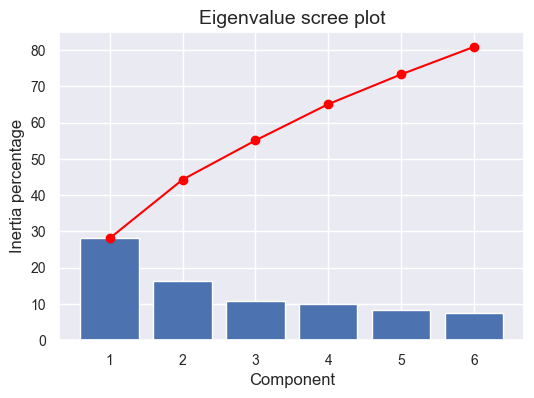

In [124]:
plt.rcParams['figure.figsize'] = [6, 4] 
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

DisplotML.display_scree_plot(pca)

Le premier plan de la PCA rassemble moins de 50% de l'inertie totale, nous verrons ce qu'il peut nous apporter.

#### Cercle des corrélations

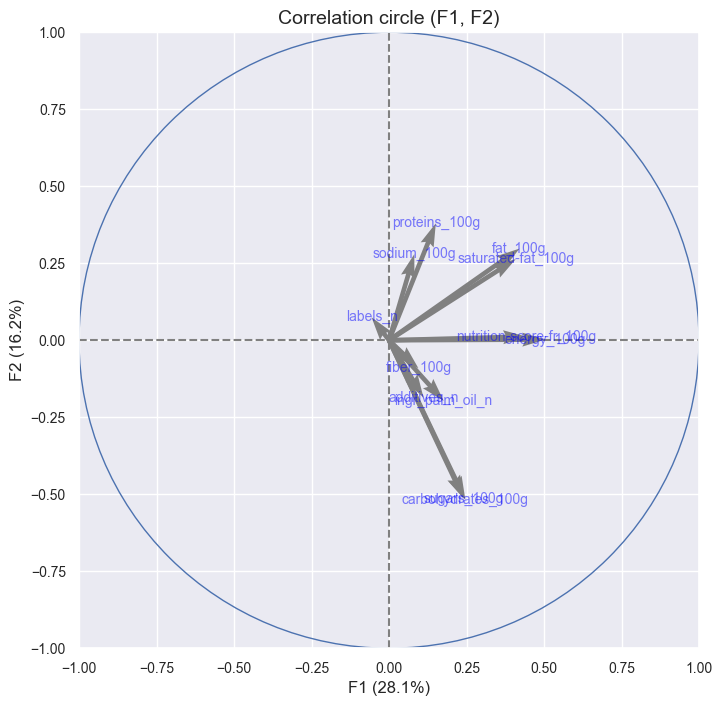

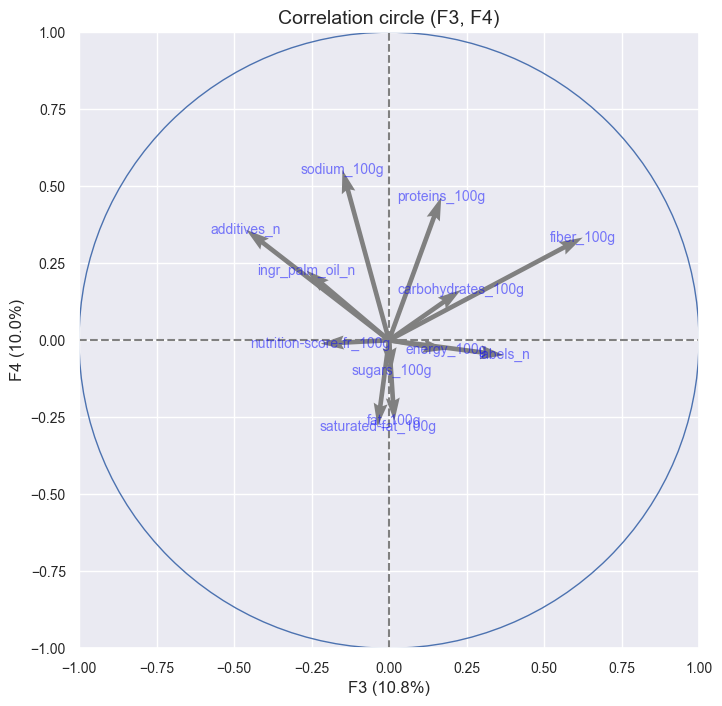

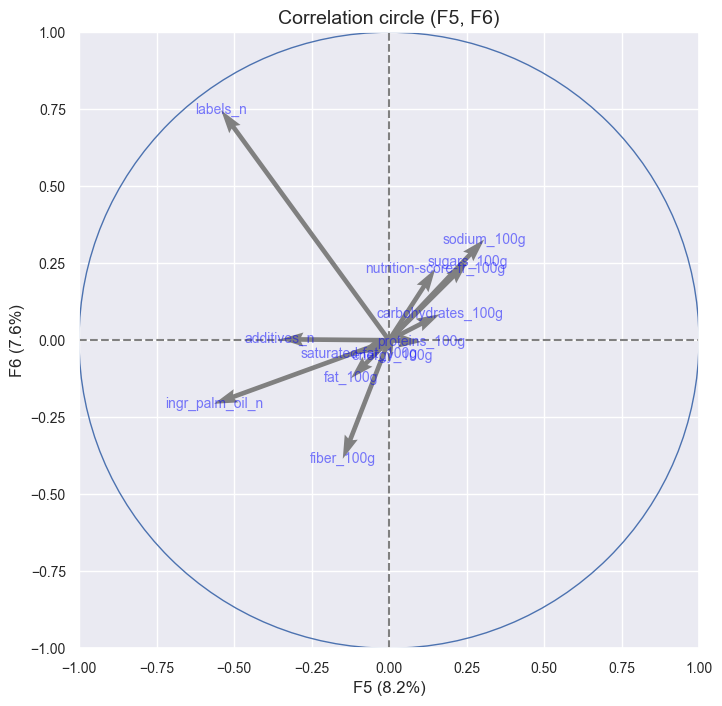

In [128]:
plt.rcParams['figure.figsize'] = [8, 8]
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

pcs = pca.components_
DisplotML.display_circles(pcs, n_comp, pca, [(0,1),(2,3),(4,5)], labels = np.array(features))

In [129]:
from sklearn.preprocessing import LabelEncoder

In [130]:
val_pnns_groups_1 = df_imp['pnns_groups_1'].values

In [131]:
# nn = 1000
nn = None

In [132]:
# %matplotlib notebook
%matplotlib inline

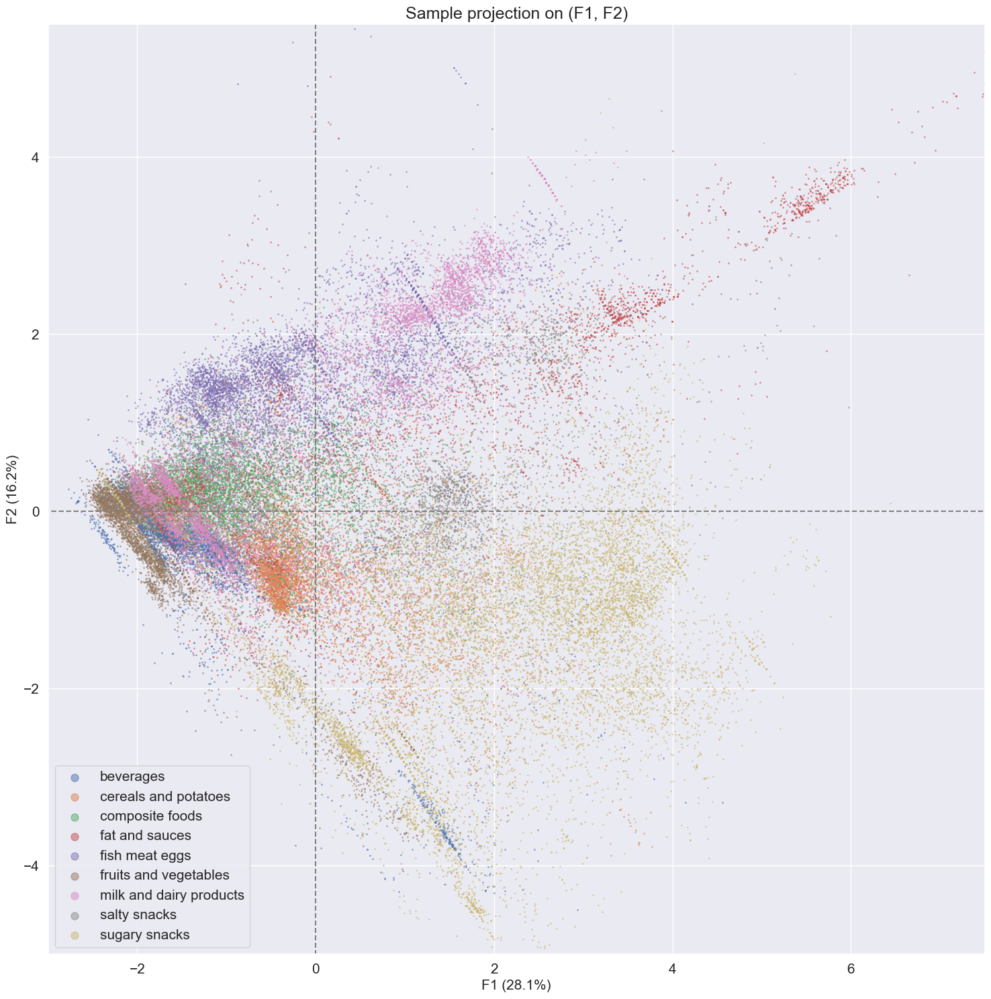

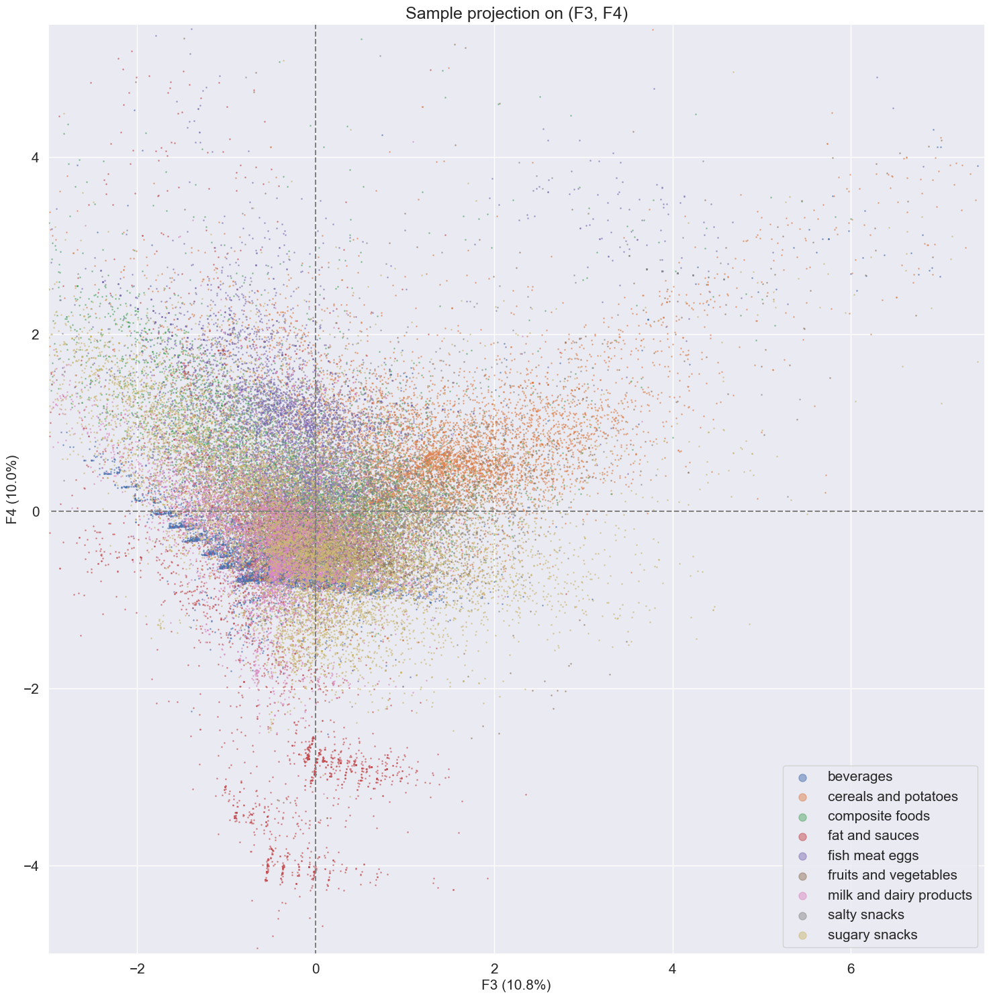

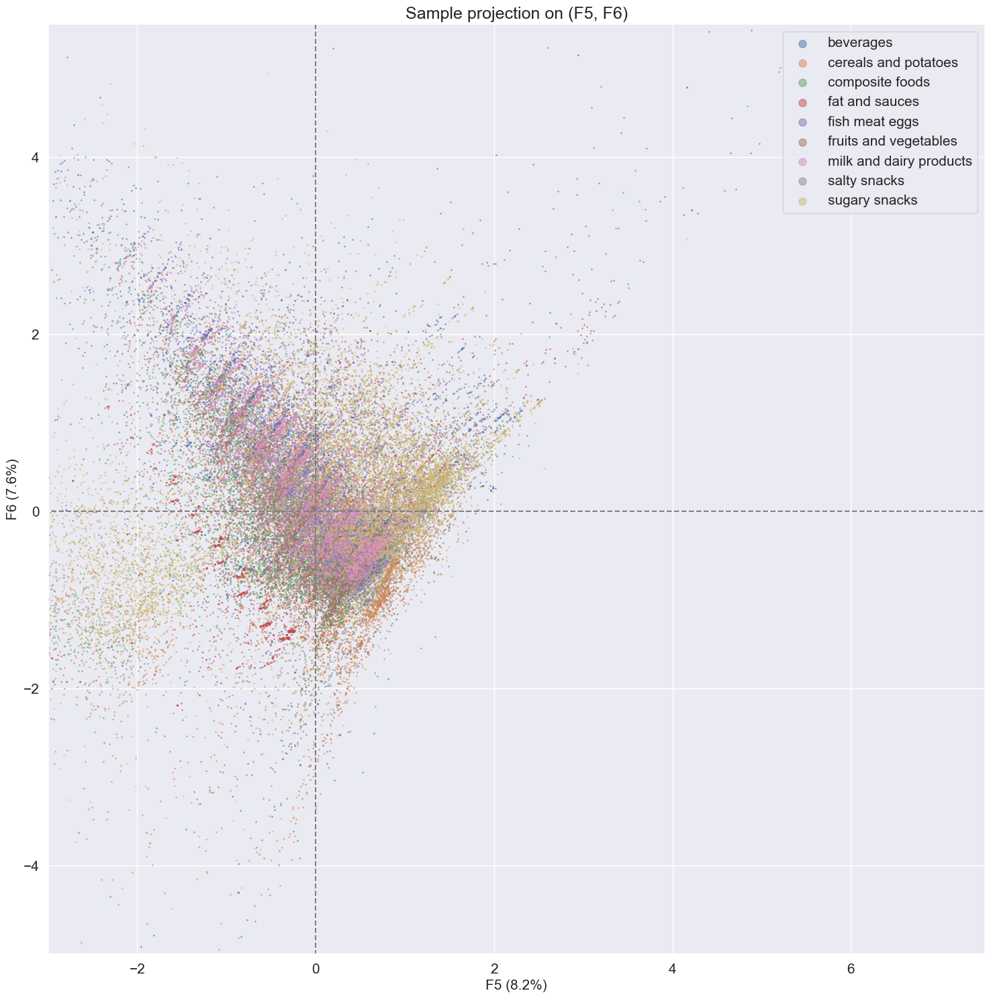

In [137]:
plt.rcParams['figure.figsize'] = [18, 18]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 15
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15

Xpca_projected = pca.transform(Xpca_scaled[0:nn, :])
DisplotML.display_factorial_planes(Xpca_projected, n_comp, pca, [(0, 1), (2, 3), (4, 5)],
                                   alpha=0.5, labels=None,
                                   illustrative_var=val_pnns_groups_1[0:nn],
                                   marker='o', s=1, markerscale=8,
                                   # (F3,F4): xlim=[-4.,4.0], ylim=[-6.,4.] # (F1,F2) : xlim=[-3.,7.5], ylim=[-5.,5.5]
                                   xlim=[-3., 7.5], ylim=[-5., 5.5]
                                   )
plt.show()

**Commentaires :**
 - les protéines contrebalancent l'énergie pour les 'fish meat eggs', car nutriscore plutôt bon (bas), donc à gauche en F1, et en haut en protéines.
 - les groupes PNNS1 ont du sens, la clusterisation aurait donné des résultats erronés pour beaucoup de points. 

#### Visualisation par groupes PNNS2

In [138]:
val_pnns_groups_2 = df_imp['pnns_groups_2'].values

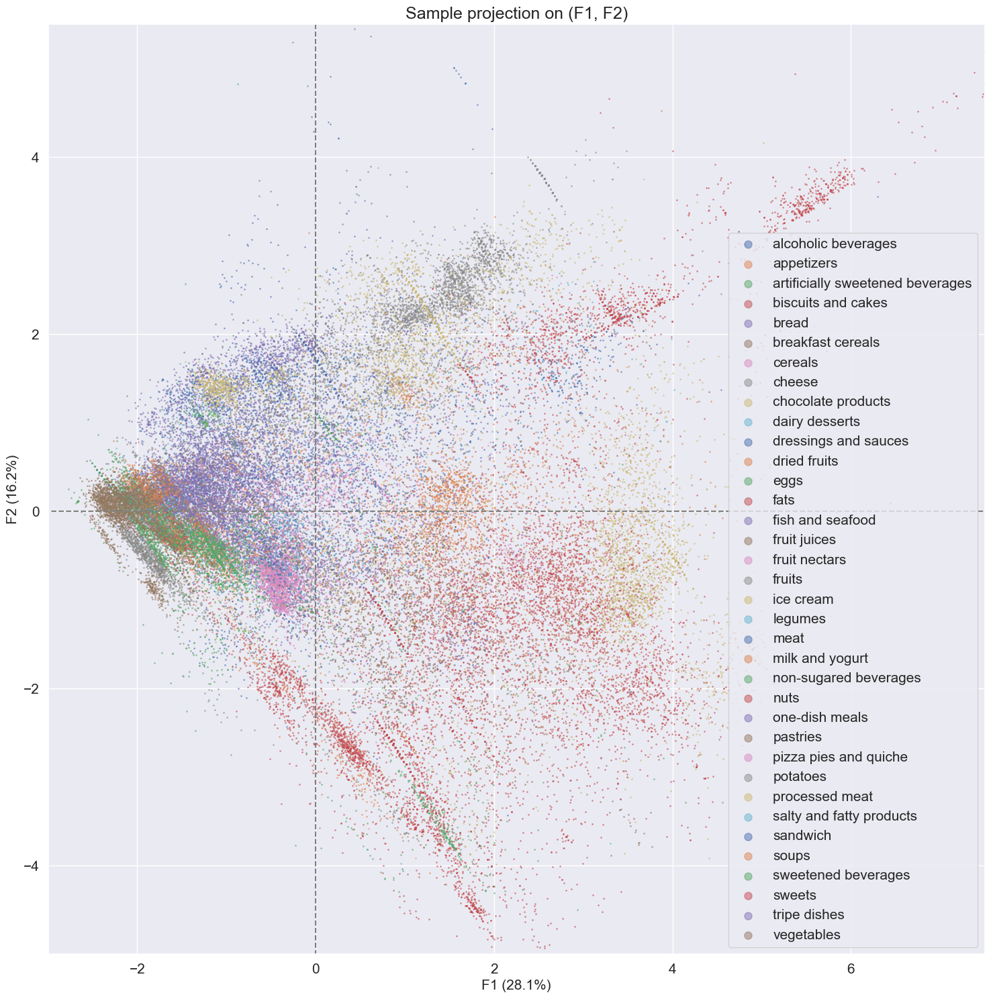

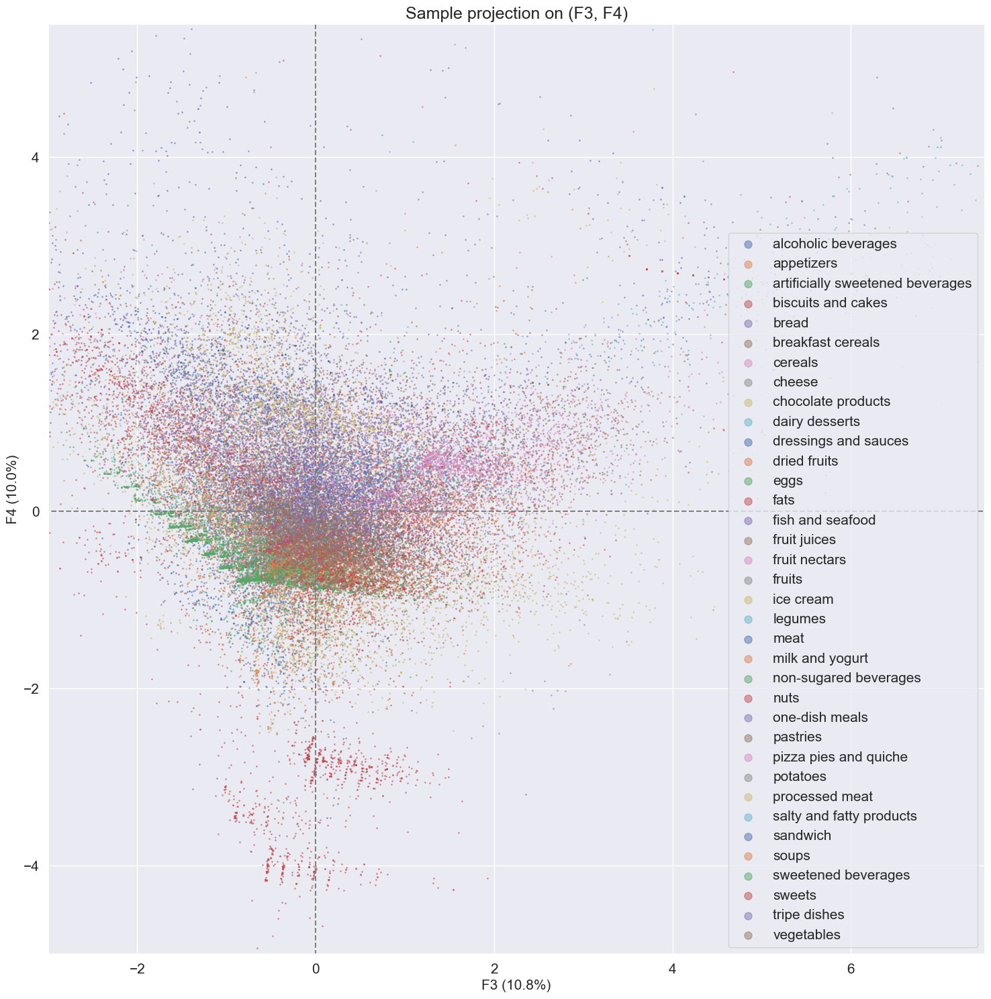

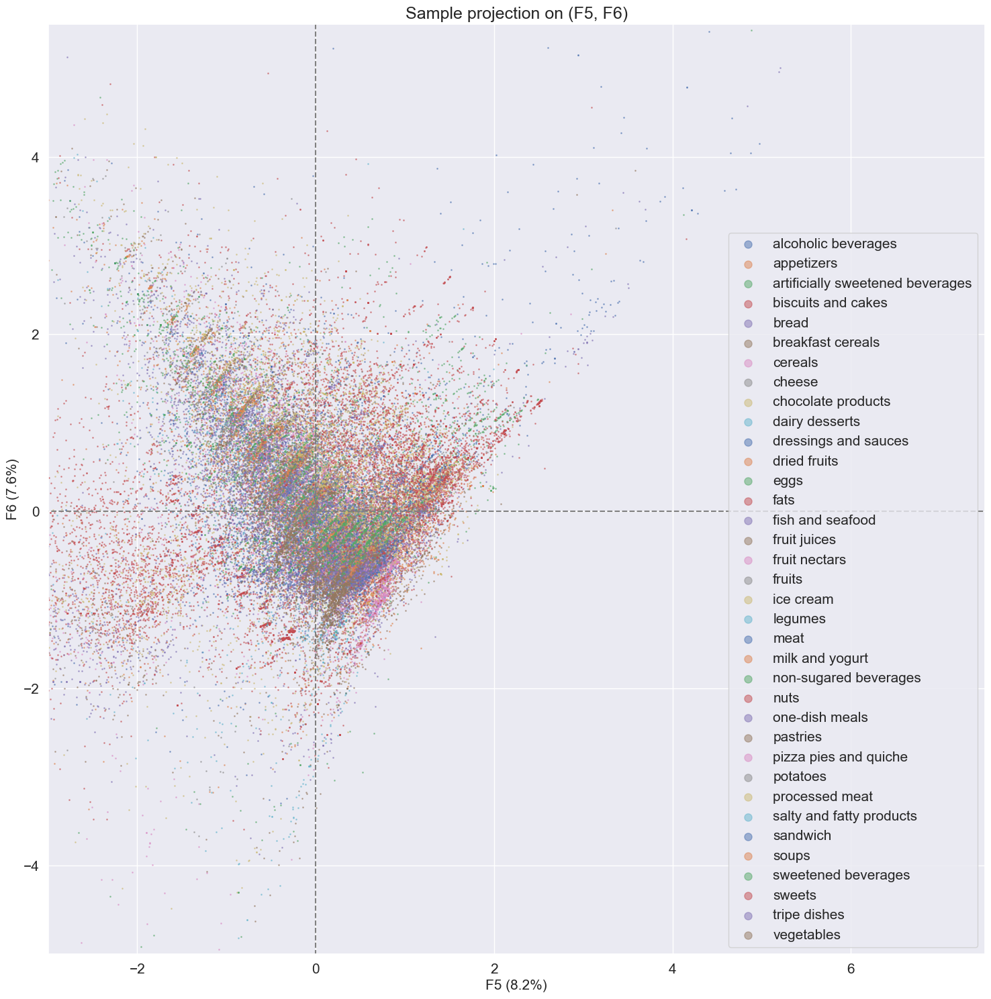

In [140]:
plt.rcParams['figure.figsize'] = [18, 18]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 15
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15

Xpca_projected = pca.transform(Xpca_scaled[0:nn, :])
DisplotML.display_factorial_planes(Xpca_projected, n_comp, pca, [(0, 1), (2, 3), (4, 5)],
                                   alpha=0.5, labels=None,
                                   illustrative_var=val_pnns_groups_2[0:nn],
                                   # (F3,F4): xlim=[-4.,4.0], ylim=[-6.,4.] # (F1,F2) : xlim=[-3.,7.5], ylim=[-5.,5.5]
                                   marker='o', s=1, markerscale=8,
                                   xlim=[-3., 7.5], ylim=[-5., 5.5]
                                   )
plt.show()

In [141]:
len(df_imp['pnns_groups_2'].unique())

36

Un peu **trop de catégories** (36) pour le nombre de couleurs que l'on peut distinguer !

⇨ Attention, il peut y avoir des nuages **confondus** sur le graphiques alors qu'ils sont **de catégorie PNNS2 distinctes** !

#### Visualisation par NutriScore

In [142]:
val_NutriScore = df_imp['nutrition_grade_fr'].values

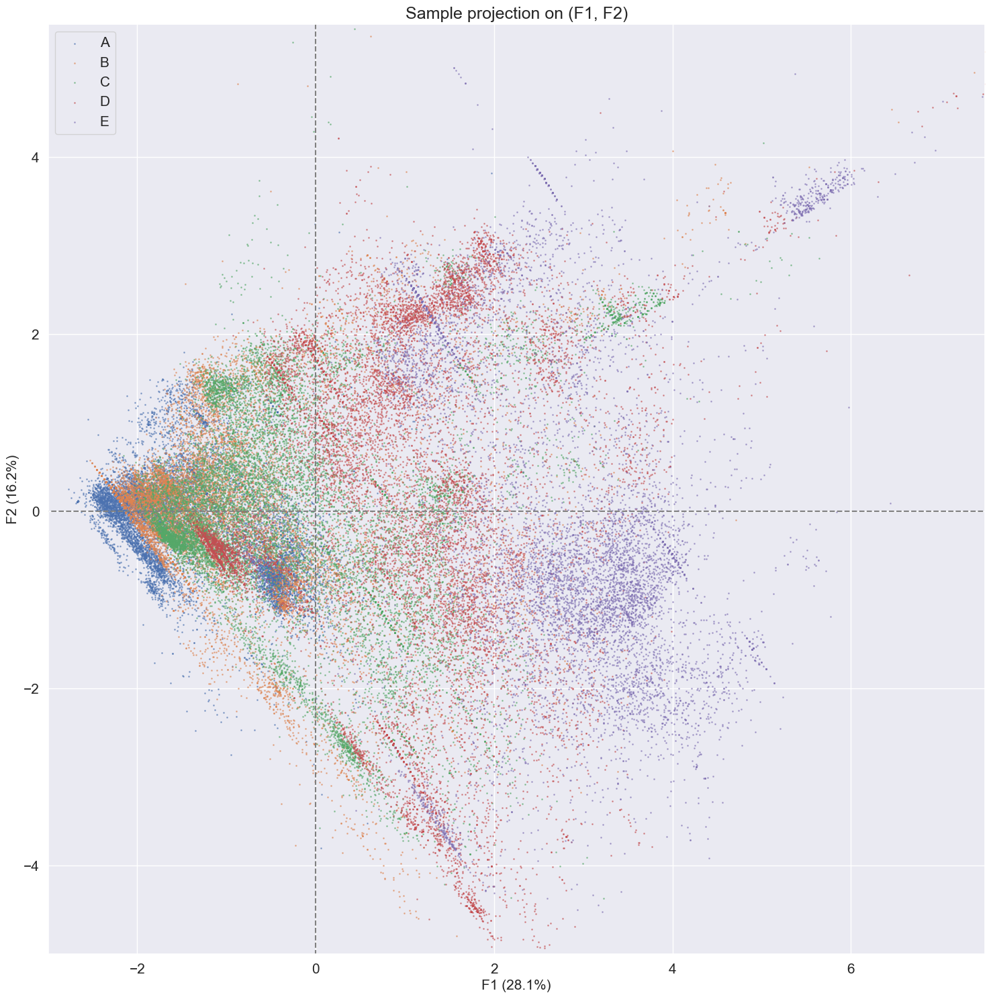

In [143]:
plt.rcParams['figure.figsize'] = [18, 18]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 15
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15

Xpca_projected = pca.transform(Xpca_scaled[0:nn, :])
DisplotML.display_factorial_planes(Xpca_projected, n_comp, pca, [(0, 1)],
                                   alpha=0.5, labels=None,
                                   illustrative_var=val_NutriScore[0:nn], 
                                   marker='o', s=1, markerscale=8,
                                   # (F3,F4): xlim=[-4.,4.0], ylim=[-6.,4.] # (F1,F2) : xlim=[-3.,7.5], ylim=[-5.,5.5]
                                   xlim=[-3., 7.5], ylim=[-5., 5.5]
                                   )
plt.show()

On retrouve la progression du NutriScore A→E le long de l'axe F1, puisque celui-ci "porte" la variable `nutrition_grade_fr`. On remarque tout de même que le nuage 'C' (vert) s'étend plus loin à droite que le nuage 'D' (rouge).
Cela peut s'expliquer par le fait que la méthode de calcul du score fait une distinction entre certains produits.